<a href="https://colab.research.google.com/github/kecbenson/DATA698/blob/master/Project_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Applying Deep Learning in Keras to a High-Energy Particle Physics Dataset

## *Kevin Benson*

### *December 18, 2020*

## Abstract
In this project, we explore the application of deep learning methods to identify signal events in a high-energy particle physics dataset.  We develop a variety of classification models using the Keras deep learning framework, and evaluate a range of design factors in order to determine our final model.  Our final model achieves an overall accuracy of 78% and AUC score of 0.86 on the test sample.  We find that this model, when trained on a subset of the data comprising only "low-level" features, performs equally well on the test sample as when the model is trained on all features in the dataset (both low-level features as well as the "high-level" or engineered features).  This implies that our final model is able to learn the discriminatory information embedded in the engineered features, making these variables redundant.  Finally we assess variable significance in the model using Shapley values.  We find that when the model is trained on all features, variable significance is highly concentrated in the high-level features; but when the model is trained on low-level features alone, variable significance is more broadly distributed across the low-level features.

**Keywords**: deep learning, neural networks, machine learning, high energy physics, Higgs dataset

Outline
* Introduction
* Literature review
* Research methodology
  + Data
  + Modeling approach
  + Computing environment and software
* Results and discussion
  + Best model
  + Low-level vs. high-level features
  + Variable importance
* Conclusion
* References
* Appendix


---
## Introduction

In high-energy particle physics experiments, like those conducted at the Large Hadron Collider (LHC) at the European Center for Nuclear Research (CERN), detectors collect massive amounts of observational data relating to particle collisions at high energy.  Such collisions are intended to produce conditions that allow for the creation of new and exotic particles.  The discovery of these particles may help physicists to better understand the elementary constituents of matter and the fundamental forces of nature.

Because of the high volume of data and relative rarity of new particles, researchers have focused on developing efficient methods of data analysis in order to discriminate signal events from background events.  Deep learning, or deep neural networks, has been a promising area of research to develop classification models for this purpose.  Such models have demonstrated the potential to detect and represent complex patterns in large datasets, achieving relatively high accuracy.  In addition computational tools to develop and evaluate deep learning models have advanced substantially in recent years, making these models relatively efficient to design and implement.

### Motivation and purpose

In this project we work with a benchmark dataset (the "Higgs dataset") that consists of simulated observational data relating to high-energy particle collisions that may produce the Higgs boson.  The dataset was generated and published by the authors of Reference [5].  Their research provided the initial motivation for this project, including some of the questions that we investigated as well as the initial network design that we explored in our model development.

The purpose of this project is to develop a variety of classification models using the Keras library for deep learning.  We apply our models to the task of signal detection in the Higgs dataset, and evaluate their predictive performance.  In the process, we intend to address the set of questions listed below.

### Research questions

Questions that we aim to explore using our deep learning models include the following:

* What are key design factors for developing a neural network model based on this data?

* How does model performance vary as a function of network parameters such as:
  + Number of layers
  + Number of units
  + Choice of layer activation
  + Choice of regularization method

* Do the engineered features in the dataset provide any predictive power to the model beyond the primary (raw measurement) features?

* Which features in the dataset have the greatest significance for discriminating between signal and background events?

* What are practical constraints (processing time / cost) of the chosen modeling approach given our computational environment?

---
## Literature review

The application of machine learning ("ML") methods to statistical analysis in high energy physics ("HEP") has received increasing research interest over the last decade.  The topic has become an academic field in its own right, with an active research community and large body of published work.  It continues to be a rich area for further research, with development of numerous applications in HEP and new use cases in other areas of physics.  Below we provide a brief review of several articles and other relevant resources.

A good starting point is the [lecture](https://cmsa.fas.harvard.edu/amir-farbin-deep-learning-in-high-energy-physics/) by Amir Farbin in 2016 [1], which gives an introduction to the field and different directions of research effort.  Farbin describes various experiments in high energy physics and the nature of the data collected, and thenn explains the challenges of data analysis and the benefits provided by deep learning.  An important point he makes is the availabilty of high quality public datasets that can be used for benchmarking and testing of new algorithms.  Another good place to start is the [HEP-ML Resources repository](https://github.com/iml-wg/HEP-ML-Resources) maintained by the Inter-Experimental LHC Machine Learning Working Group [2].  The repo contains a listing and links to a variety of useful learning materials (lectures, tutorials, etc.), software, public datasets, academic papers, and other resources.

A more advanced introduction is given in a 2018 community white paper [3], written by a large cross section of researchers in the high energy physics and machine learning fields.  The white paper gives a broad overview of different machine learning applications in HEP including simulation of particle / detector interactions, event reconstruction and identification, feature extraction, and end-to-end deep learning, among others, and highlights challenges and promising areas for future research and development. The white paper also emphasizes opportunities for collaboration between the HEP and ML communities, including both academia and industry, with a particular focus on ML software and tools as well as computing and hardware resources.  The paper notes (as of its writing in 2017) that typical ML applications in HEP may "require up to 1 GPU-week to train a single model", and that with hyper-parameter tuning, a project may "easily require up to a full GPU-year for training."

Guest, Cranmer, and Whiteson [4] provide a survey of selected machine learning techniques applied to data analysis in high-energy physics.  The authors start from first principles and explain the problem of particle detection as one of identifying extremely low-frequency signals in a high-dimensional data space.  They outline the mathematical framework of deep learning, and describe how deep neural networks can provide hierarchical representations of the data using modular, differentiable components.  They describe early machine learning approaches such as "shallow" neural networks based on highly engineered data features in a lower-dimensional space, and discuss how the field has moved to deep neural networks based on lower-level data in a much higher-dimensional space.  Deep neural network models tend to obviate the need for extensive feature engineering and pre-processing, while at the same improving classification performance.  Of course, this comes at the cost of more intensive computational resources and data infrastructure.  The authors describe several applications of deep learning to HEP, including event reconstruction, selection, and identification, and highlight several challenges.  One such challenge relates to the "trade-off between performance and interpretability", as the "non-parametric nature of the neural network approach make it very difficult to interpret the solution."

The research piece by Baldi, Sadowski, and Whiteson [5] is one of the primary papers that motivate this project.  In this paper, the authors focus on classification of signal-versus-background events based on simulated HEP data.  They demonstrate that deep learning tools based on neural networks can effectively discriminate between signal events (new particles) and background noise.  The authors consider two benchmark datasets relating to particle detection of the Higgs boson and supersymmetry particles.  In both cases they construct classification models based on boosted decision trees, shallow neural networks, and deep neural networks.  Their results indicate that deep neural networks are more effective at classification than the other two methods, and also do not require high-level feature engineering.  Using deep neural network models, they were able to achieve AUC scores of ~0.88 for classification of both the Higgs and supersymmetry datasets.  The models were implemented using Theano and Pylearn2 libraries in Python (which as of 2020 are no longer supported), in a GPU (NVIDIA) computing platform. Both the [Higgs](archive.ics.uci.edu/ml/datasets/HIGGS) and [supersymmetry](archive.ics.uci.edu/ml/datasets/SUSY) datasets were made publicly available at the UCI Machine Learning Repository.

Ojika, Acosta, Ross, et. al. [6] also investigated deep learning methods
applied to data analysis of the benchmark Higgs dataset (the same dataset published in reference [5]).  The authors developed two neural network models based on two and three sequential layers, and then evaluated their classification performance on the Higgs dataset, achieving AUC scores in the 0.7 - 0.8 range.  The models were implemented in TensorFlow and Theano, running on a supercomputer cluster at the San Diego Supercomputing Center.  The results of the analysis indicated that the second model with three sequential layers generated stronger prediction accuracy.  The authors suggest ideas for further work, including increasing the number of network layers, comparing different loss optimizers, and developing more efficient computational design. 

Strong [7] conducted an exhaustive investigation of deep learning techniques applied to a binary classification problem, using the 2014 Higgs ML Kaggle dataset.  The various models were evaluated with a variety of performance metrics as well as the time required for training and inference.  Some of the advanced techniques explored in the paper include data augmentation, learning rate and momentum scheduling, ensembling, and alternative model architectures.  Alternative architectures included tuning of various hyper-parameters including various activation functions (ReLU, PReLU, SELU), densely connected layers, number of hidden layers (depth), number of neurons per hidden layer (width), dropout rates, and amount of $L_2$ regularization.  The author found that various models were able to achieve performance metrics similar to the winning solutions of the Kaggle challenge, but required significantly shorter training time and less computational resources.  The author developed and implemented the models using the Python libraries PyTorch and Lumin (a wrapper library developed by the author), and used several CPU and GPU (NVIDIA) hardware configurations.

A variety of authors have explored representing HEP observational data as images, and adapting deep learning image-processing techniques for classification.  Racah, Ko, Sadowski, et. al. [8] analyzed experimental data from the Daya Bay neutrino experiment, and applied both unsupervised and supervised convolutional neural networks to learn high-level representations of the raw data.  The unsupervised learning approach was used to obtain well-defined clusters in the data, which might be related to distinct underlying physics phenomena.  The supervised learning approach was used to develop a multi-class classifier that achieved accuracy of greater than 0.97, which exceeded the performance of support vector machine (SVM) and k-nearest neighbor (k-NN) classifiers.  The deep learning modeling was implemented in neon (an open source library) using Cray XC computing systems at the National Energy Research Scientific Computing Center.

de Oliveira, Kagan, Mackey, et. al. [9] analyzed simulated HEP collision data as "jet images", and applied ML and computer vision techniques to the low-level data to find higher-level representations of the data.  They used convolution networks with fully connected layers for event classification, which provided greater discrimination power than more traditional approaches.  The deep learning models were also used for visualization of the raw data as well as feature selection.  The deep learning modeling was conducted in Python using the Keras library in a GPU (NVIDIA) computing environment.

Andrews, Paulini, Gleyzer, et. al. [10] constructed image-based classfiers that discriminate signal versus background events for simulated detector data from the Large Hadron Collider (LHC) at CERN.  The authors developed "end-to-end" event classifiers, in which the classifiers are applied directly to the low-level detector data as input.  Using the 2012 CMS Simulated Open Data (a public dataset from CERN), they developed convolutional neural networks trained on composite images reconstructed from the raw data; these models exhibited robust performance, with AUC scores of 0.71 to 0.97 for a range of classification tasks.  The models were implemented using the PyTorch library on a GPU (NVIDIA) computing platform.

In a different application of ML to HEP, Brehmer, Cranmer, Louppe, et. al. [11] used a variety of neural network techniques to analyze detector data and infer statistical properties (including likelihood ratios) of fundamental parameters relating to Standard Model physics.  The statistical properties can be viewed as a form of dimensionality reduction (from the raw high-dimensional observables to the low-dimensional statistical scores), which scales efficiently with larger-size datasets.  Importantly, the statistical properties and likelihood ratios can be used to place tighter constraints (upper or lower bounds) on fundamental physics parameters than available using more traditional approaches.

Finally, Crispim Romao, Castro, Milhano, et. al. [12] described a new metric for particle collisions (the "energy mover's distance"), which can be used as a high-level feature to improve discrimination power in multi-class event classifiers.  The authors trained dense neural networks to perform event classification of simulated data from the LHC at CERN.  They found that including the new metric as an input feature contributed to greater discrimination performance (and higher AUC scores) compared to not including it.  The models were implemented using the Keras and TensorFlow 2.0 libraries in a GPU (NVIDIA) computing environment.


---
## Research methodology

In this section we discuss the dataset, the modeling approach, and the computing environment used in this project.

### Data

The source of the data is the benchmark [Higgs dataset](https://archive.ics.uci.edu/ml/datasets/HIGGS#) located in the UCI Machine Learning Repository.  As described in Reference 5, the dataset was generated Monte Carlo simulations of particle detector measurements.  The dataset includes 11 million observations of 28 numerical attributes, of which the first 21 features (`X1` through `X21`) are direct particle measurements, while the last 7 (`X22` through `X28`) are engineered features derived from the primary measurements.  In the analysis below, we refer to the first 21 variables as "low-level" features and the last 7 variables as "high-level" features.  The target variable (`y`) consists of binary class labels (1 = signal, 0 = background).

Descriptive statistics of the dataset are shown in Table 1 below.  It is apparent that the target variable is nearly balanced with **53% signal events** across the dataset.

In [ ]:
#@title 
### import libraries and set random seeds for reproducibility
seed_value = 314159
import os; os.environ['PYTHONHASHSEED']=str(seed_value)
import random; random.seed(seed_value)
import numpy as np; np.random.seed(seed_value)
import pandas as pd
import tensorflow as tf; tf.random.set_seed(seed_value)
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import initializers
from tensorflow.keras import regularizers
from tensorflow.keras import optimizers
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from google.colab import widgets

### need libraries below if reading data directly from GCS
!pip install fsspec
!pip install gcsfs
import fsspec
import gcsfs

### need shap library for variable importance
!pip install shap
import shap

In [ ]:
#@title
### load dataset: can either (a) copy file from GCS to local drive and then read, 
### or (b) read the file directly from GCS
project_id = 'data698'
gcs_data_path = 'gs://higgs-data/HIGGS.csv'  # GCS location
local_data_path = '/tmp/HIGGS.csv'  # local drive
from google.colab import auth
auth.authenticate_user()
!gcloud config set project {project_id}

start_time = datetime.now()
### use if reading from local drive
!gsutil cp {gcs_data_path} {local_data_path}
raw_df = pd.read_csv(local_data_path, header=None) #, nrows=1e6)
### use if reading directly from GCS file
#raw_df = pd.read_csv(gcs_data_path, header=None) #, nrows=1e6)
load_time = datetime.now() - start_time
print('Data load time (minutes): ' + str(round(load_time.seconds / 60, 2)))

# set target dtype & set column names
raw_df[0] = raw_df[0].astype('int')
colnames = ['y']
colnames.extend(["X"+str(j+1) for j in range(raw_df.shape[1] - 1)])
raw_df.columns = colnames
raw_df.info()

In [ ]:
#@title #####Table 1: Descriptive statistics of the dataset
raw_df.describe().T

,count,mean,std,min,25%,50%,75%,max
y,11000000.0,0.529920,0.499104,0.000000,0.000000,1.000000,1.000000,1.000000
X1,11000000.0,0.991466,0.565378,0.274697,0.590753,0.853371,1.236226,12.098914
X2,11000000.0,-0.000008,1.008827,-2.434976,-0.738322,-0.000054,0.738214,2.434868
X3,11000000.0,-0.000013,1.006346,-1.742508,-0.871931,-0.000241,0.870994,1.743236
X4,11000000.0,0.998536,0.600018,0.000237,0.576816,0.891628,1.293056,15.396821
X5,11000000.0,0.000026,1.006326,-1.743944,-0.871208,0.000213,0.871471,1.743257
X6,11000000.0,0.990915,0.474975,0.137502,0.678993,0.894819,1.170740,9.940391
X7,11000000.0,-0.000020,1.009303,-2.969725,-0.687245,-0.000025,0.687194,2.969674
X8,11000000.0,0.000008,1.005901,-1.741237,-0.868096,0.000058,0.868313,1.741454
X9,11000000.0,0.999969,1.027808,0.000000,0.000000,1.086538,2.173076,2.173076


Figures 1 and 2 below show **univariate distributions** of each feature variable (`X1` through `X28`).  The raw histograms for some variables exhibit some degree of noise as well as oscillation pattern (most likely attibutable to the Monto Carlo simulation used to generate the data), so we also show kernel density estimates for clarity.  The distributions are conditioned on the target variable (`y`) in order to distinguish signal and background observations.  Reviewing the low-level variables (`X1` through `X21`), it is apparent that differences in the univariate distributions between signal and background events are very slight and almost imperceptible.  However, signal and background events are more easily differentiated in distributions of the high-level variables (`X22` through `X28`), particularly `X25` through `X28`.  As discussed in Reference 5, the high-level features are engineered variables designed by physicists, which are meant to capture distinct characteristics of the underlying physical interactions. 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

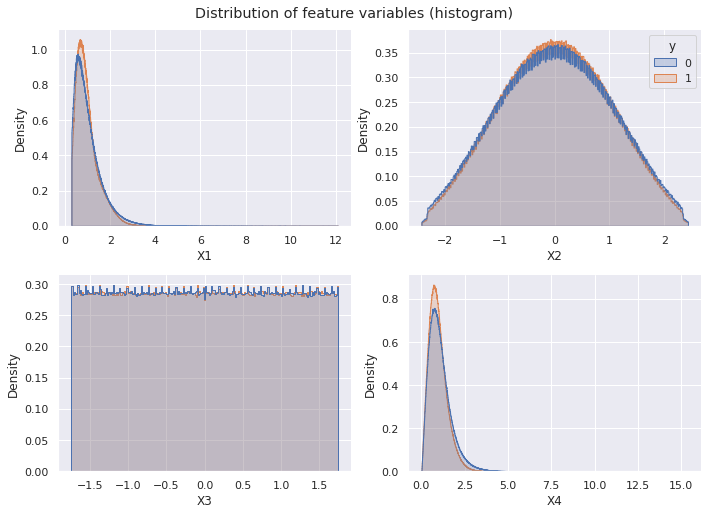

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

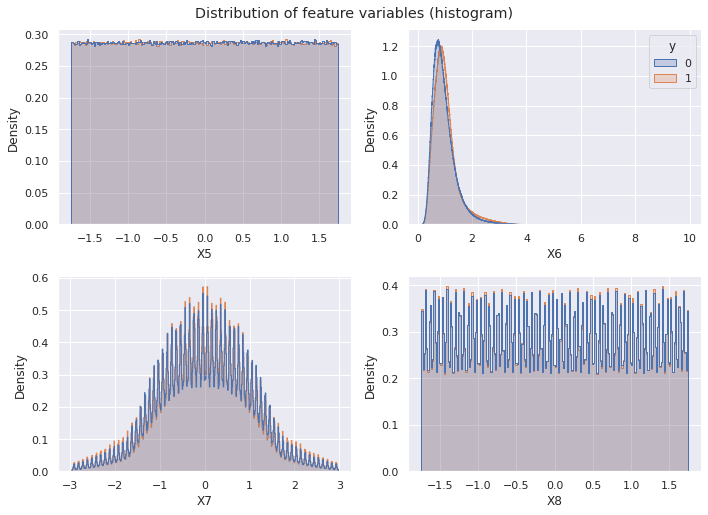

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

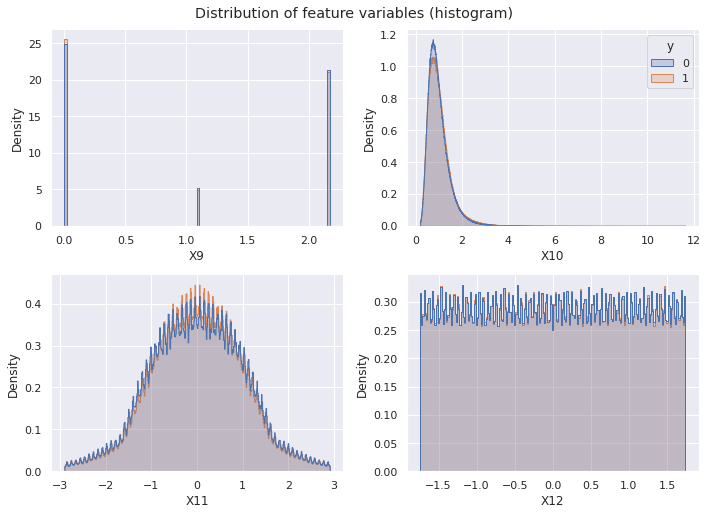

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

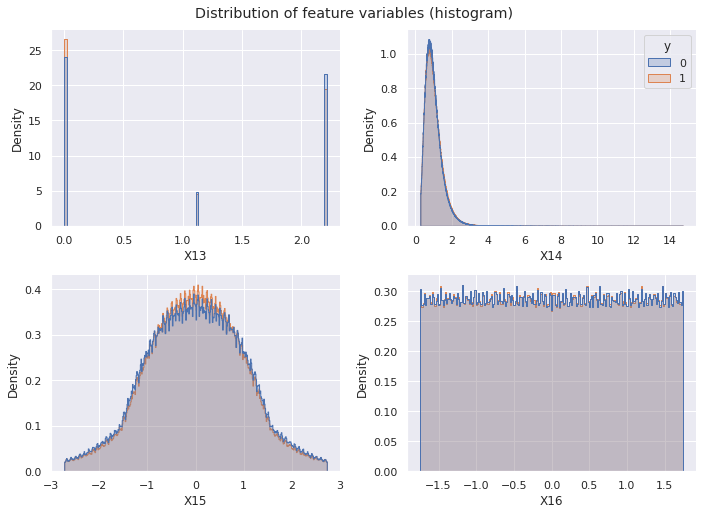

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

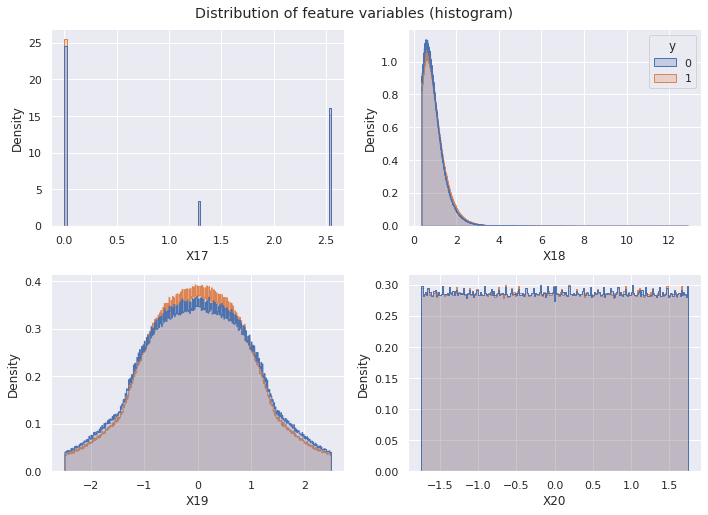

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

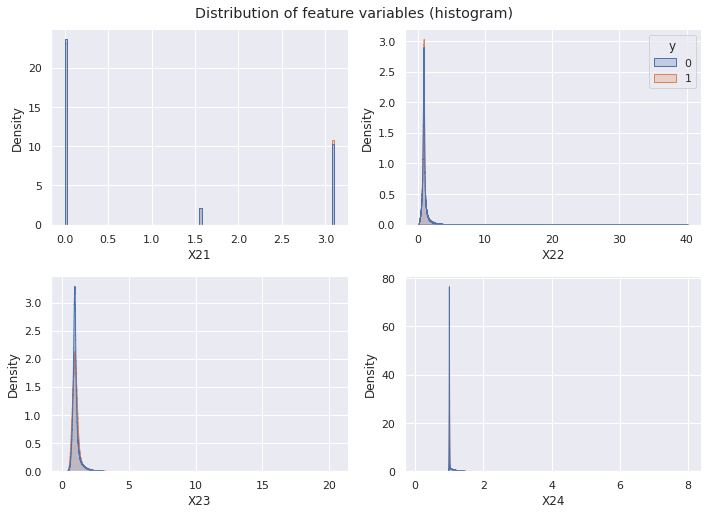

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

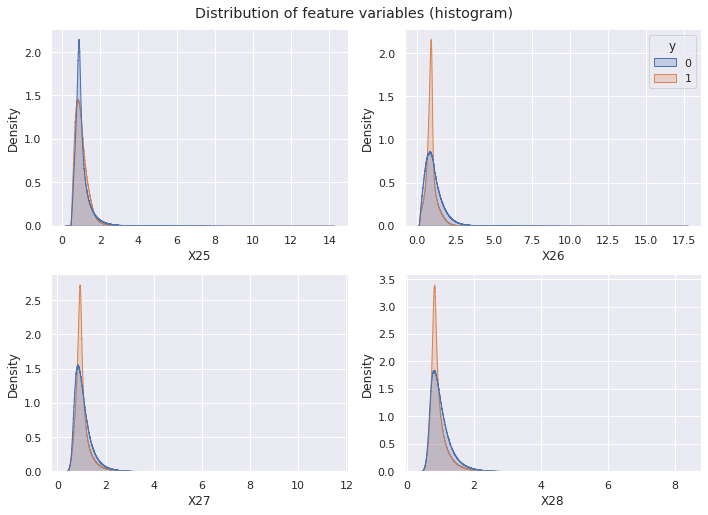

<IPython.core.display.Javascript object>

In [ ]:
#@title ##### Figure 1: Univariate (histogram) distributions of the feature variables
# plot univariate distributions - histograms
num_axs = raw_df.shape[1] - 1
num_tabs = int(num_axs / 4)
tb = widgets.TabBar(['X'+str(i*4+1)+'-X'+str(i*4+4) for i in range(num_tabs)])
for i in range(num_tabs):
  with tb.output_to(i, select=False):
    fig, axs = plt.subplots(2, 2, figsize=(10,7), sharey=False)
    sns.despine(fig)
    for j in range(4):
      sns.histplot(data=raw_df, x=raw_df.columns[i*4+j+1], hue='y', stat='density', 
                   common_norm=False, element='step', fill=True, #alpha=0.2, 
                   kde=False, ax=axs[divmod(j, 2)], legend=(j==1))
    fig.suptitle('Distribution of feature variables (histogram)', y=1.02)
    plt.tight_layout()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

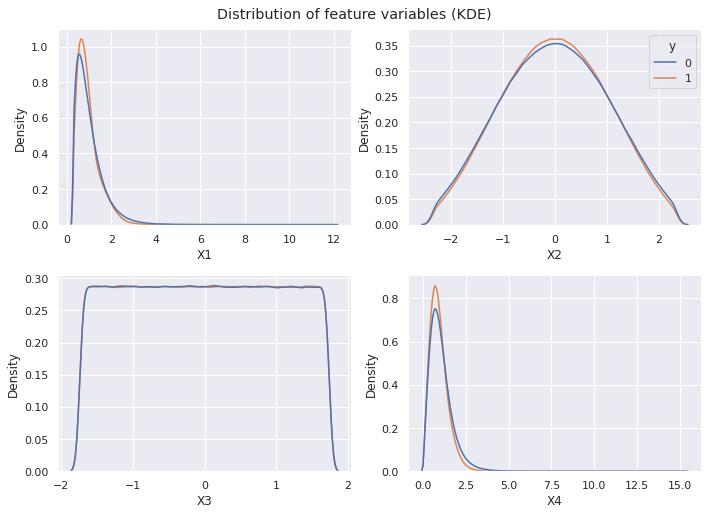

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

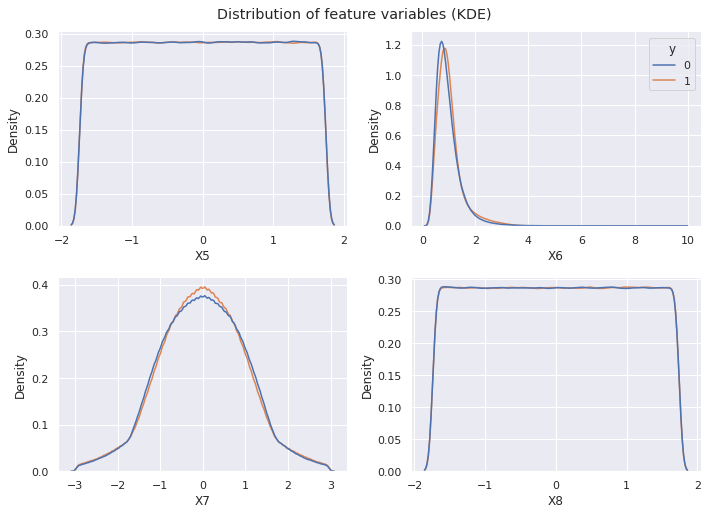

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

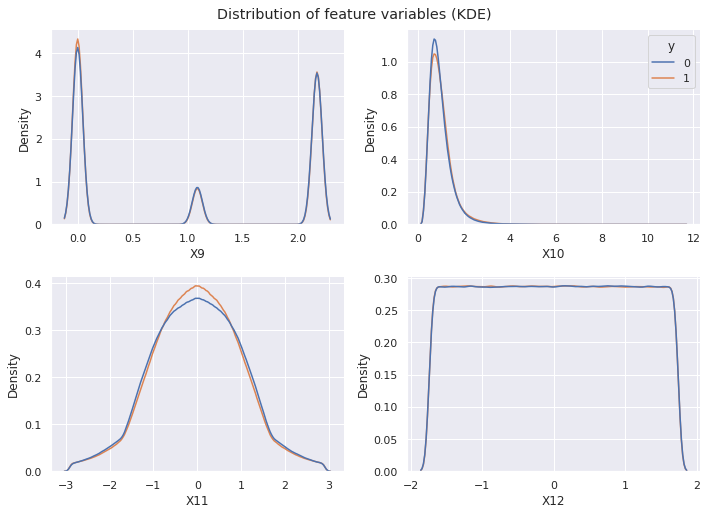

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

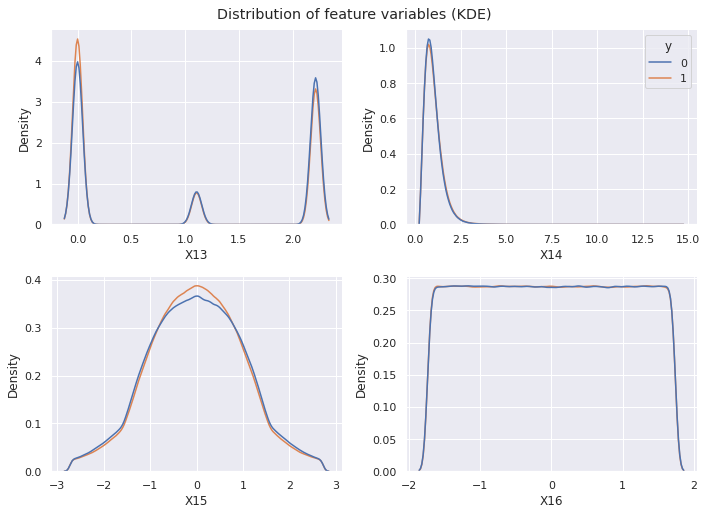

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

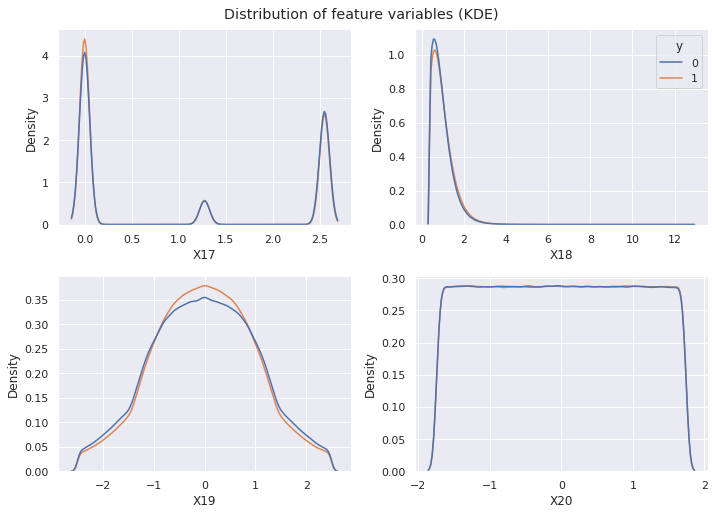

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

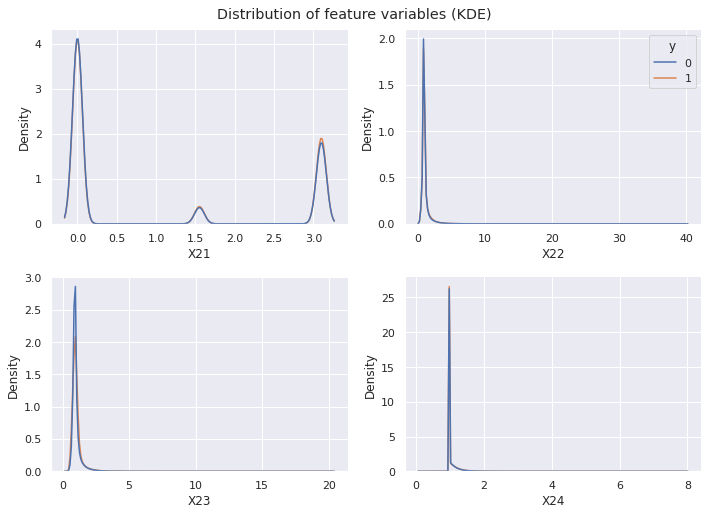

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

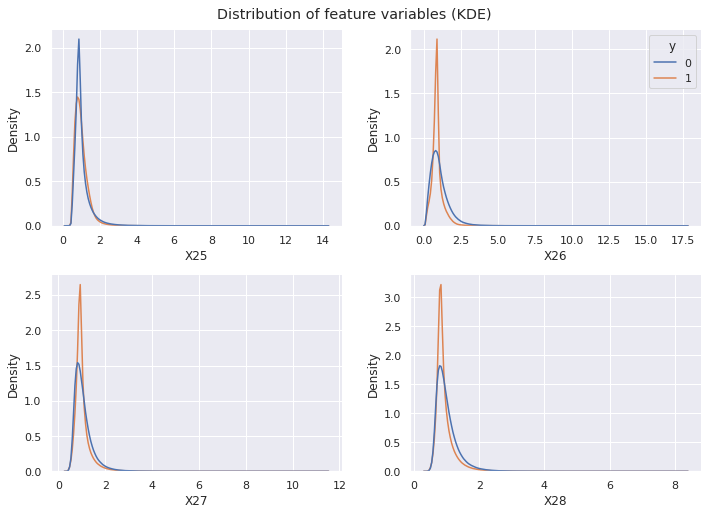

<IPython.core.display.Javascript object>

In [ ]:
#@title ##### Figure 2: Univariate (KDE) distributions of the feature variables
# plot univariate distributions - KDE
num_axs = raw_df.shape[1] - 1
num_tabs = int(num_axs / 4)
tb = widgets.TabBar(['X'+str(i*4+1)+'-X'+str(i*4+4) for i in range(num_tabs)])
for i in range(num_tabs):
  with tb.output_to(i, select=False):
    fig, axs = plt.subplots(2, 2, figsize=(10,7), sharey=False)
    sns.despine(fig)
    for j in range(4):
      sns.kdeplot(data=raw_df, x=raw_df.columns[i*4+j+1], hue='y', common_norm=False, 
                  common_grid=True, fill=False, ax=axs[divmod(j, 2)], legend=(j==1))
    fig.suptitle('Distribution of feature variables (KDE)', y=1.02)
    plt.tight_layout()

In Figures 3 and 4 below, we plot **bivariate relationships** between selected low-level and high-level features, again conditioned on the target variable.  In these figures, observations of the selected variables are shown in scatter plots (above the diagonal) and bivariate (KDE) distributions (below the diagonal), while the univariate (KDE) distributions are shown along the diagonal.  The variables shown in the figures were among those that appeared to have the strongest separation between signal and background events.

Similar to the pattern observed above for the univariate distributions, the bivariate distributions for the low-level variables exhibit weak separability between signal and background events.  However, the high-level variables exhibit stronger separability, which suggests their importance as predictors in a classification model for the target variable.  This is consistent with their design, since the high-level features were engineered to improve 
discrimination power with respect to signal events.


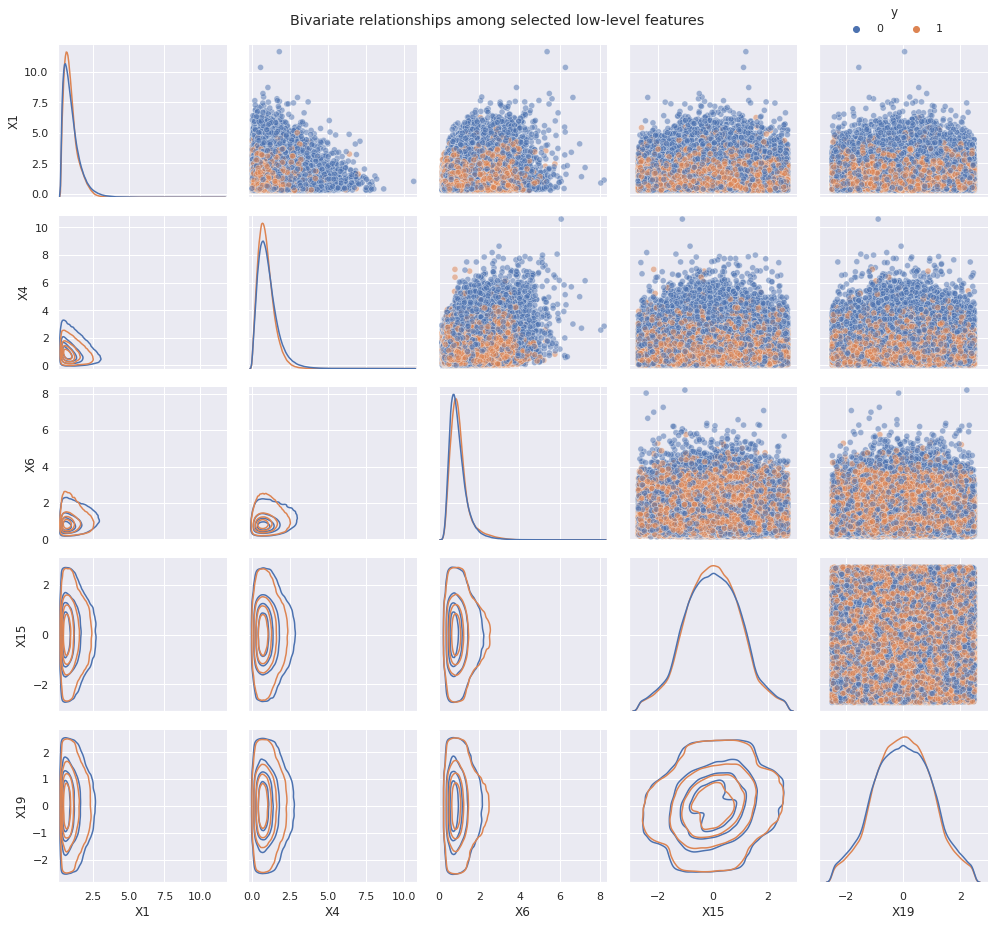

In [ ]:
#@title ##### Figure 3: Bivariate relationships among selected low-level feature variables
# sample data for pairs plot
sample_df = raw_df.sample(int(1e6), random_state=seed_value)

# pair plot - low-level features
g = sns.PairGrid(sample_df, vars=['X1', 'X4', 'X6', 'X15', 'X19'], hue='y', 
                 corner=False, diag_sharey=False)
g.map_diag(sns.kdeplot, common_norm=False, common_grid=True, fill=False)
g.map_lower(sns.kdeplot, common_norm=False, common_grid=True, fill=False, levels=5)
g.map_upper(sns.scatterplot, alpha=0.5)
g.add_legend(loc='lower left', bbox_to_anchor=(0.83, 0.98), ncol=2) 
plt.suptitle('Bivariate relationships among selected low-level features', y=1.02)
plt.tight_layout()

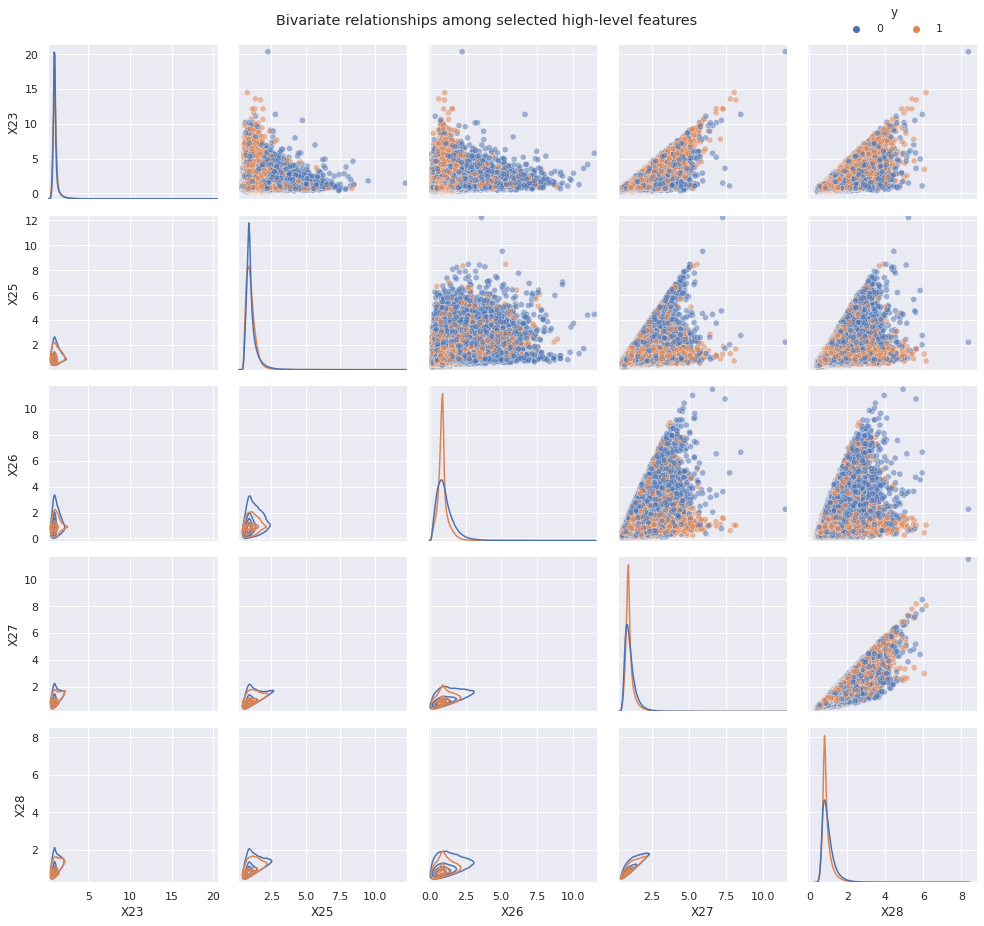

In [ ]:
#@title ##### Figure 4: Bivariate relationships among selected high-level feature variables
# pair plot - high-level features
g = sns.PairGrid(sample_df, vars=['X23', 'X25', 'X26', 'X27', 'X28'], hue='y', 
                 corner=False, diag_sharey=False)
g.map_diag(sns.kdeplot, common_norm=False, common_grid=True, fill=False)
g.map_lower(sns.kdeplot, common_norm=False, common_grid=True, fill=False, levels=5)
g.map_upper(sns.scatterplot, alpha=0.5)
g.add_legend(loc='lower left', bbox_to_anchor=(0.83, 0.98), ncol=2) 
plt.suptitle('Bivariate relationships among selected high-level features', y=1.02)
plt.tight_layout()

Finally, in Figure 5 below, we show **correlation heatmaps** of the feature variables, for all observations as well as observations conditioned on the target variable.  The high-level features are highly correlated with certain low-level features, which is expected since the high-level features are derived from the primary measurements.  For instance, `X25` through `X28` show strong correlations with `X6` and `X10`, particularly for background events compared to signal events.  Complete **correlation matrices** for all feature variables can be found in the Appendix.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

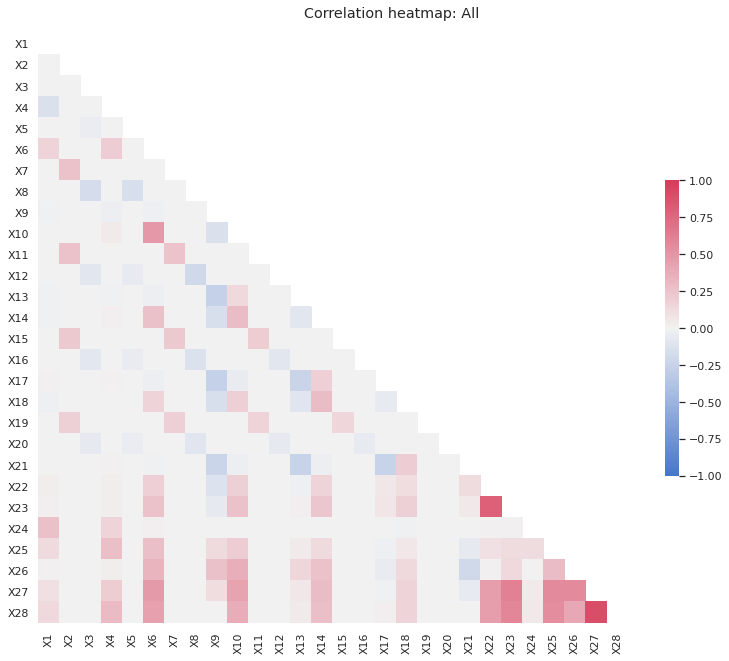

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

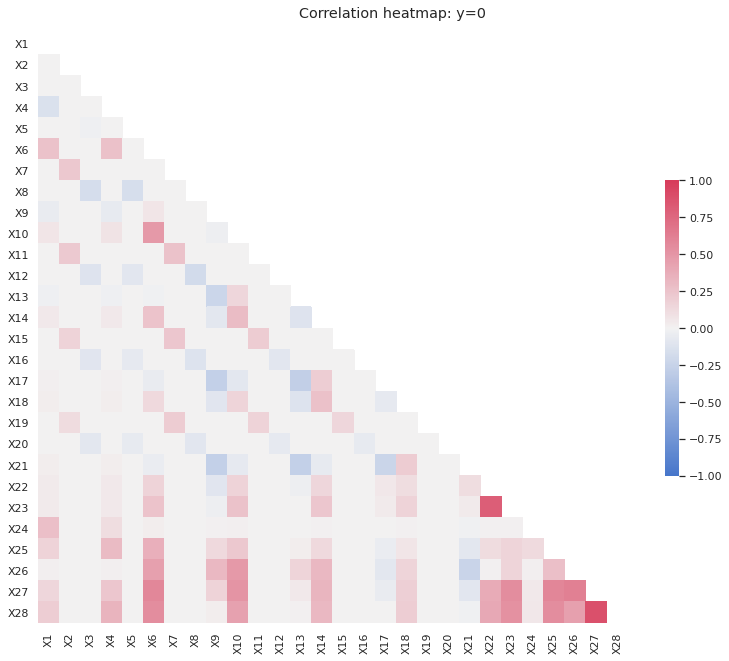

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

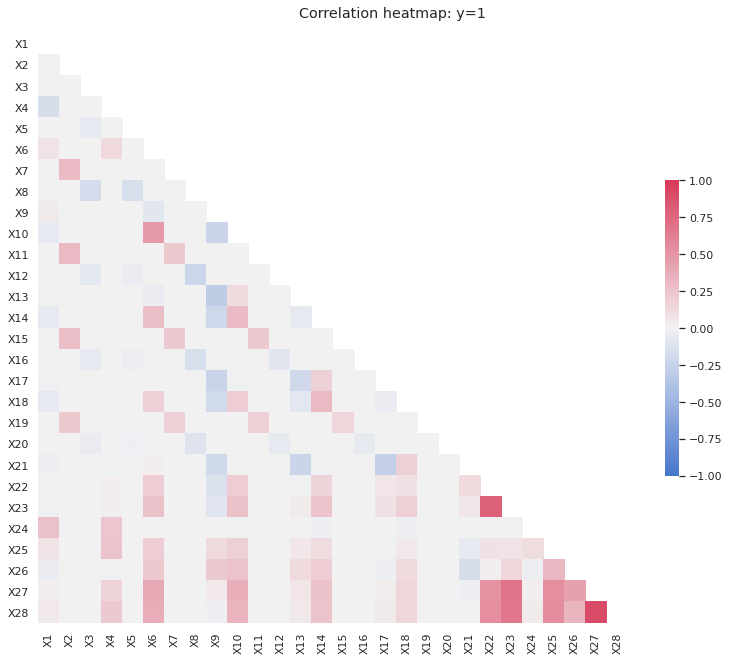

<IPython.core.display.Javascript object>

In [ ]:
#@title ##### Figure 5: Correlation heatmap of the feature variables
# plot correlation matrices / heatmaps
corrmat0 = raw_df.iloc[:, 1:].corr().round(2)
corrmat1 = raw_df[raw_df.y == 0].iloc[:, 1:].corr().round(2)
corrmat2 = raw_df[raw_df.y == 1].iloc[:, 1:].corr().round(2)
corrmat = [corrmat0, corrmat1, corrmat2]

# colormap - blue to red
cmap = sns.diverging_palette(255, 5, as_cmap=True) #230, 20
# mask for upper triangular entries
corrmask = np.triu(np.ones_like(corrmat[0], dtype=bool))

# tab bar
tabs = ['All', 'y=0', 'y=1']
tb = widgets.TabBar(tabs)
for i in range(len(tabs)):
  with tb.output_to(i, select=False):
    with sns.axes_style("white"):
      f, ax = plt.subplots(figsize=(11, 9))
      ax = sns.heatmap(corrmat[i], mask=corrmask, cmap=cmap, vmin=-1, vmax=1, 
                       center=0, square=True, cbar_kws={"shrink": 0.5})
    plt.suptitle('Correlation heatmap: ' + tabs[i], y=1.02)
    plt.tight_layout()

### Modeling approach

The methodology used to develop a classification model for this project involved training, evaluating, and tuning a variety of deep learning models.  In order to do this, we followed a standard machine-learning workflow, which included the following stages: (a) **data preparation**, (b) **training** a range of models, and (c) **evaluating and tuning** the models.  Below we provide details of each stage and illustrate using an example model, which we refer to as "SGD_base".

In [ ]:
#@title
##################################################################
### functions used in data prep, model fitting, and evaluation
##################################################################

### get tensorflow datasets based on features subset and batch size
def get_datasets(features='all', batch=512): 
  '''function to extract features from x
  inputs:
    features = features to extract: **'all'**, 'low', 'high'
    batch = batch size for tf dataset: 64, 128, 256, **512**, 1024
  output: training, validation & test sets
  '''
  def get_features(x, kind): 
    return x.loc[:, :'X21'] if kind=='low' else (x.loc[:, 'X22': ] if kind=='high' else x) 
  ### return tf datasets of training, validation & test samples
  return (tf.data.Dataset.from_tensor_slices((get_features(x_train, features), y_train)).batch(batch), 
          tf.data.Dataset.from_tensor_slices((get_features(x_val, features), y_val)).batch(batch), 
          tf.data.Dataset.from_tensor_slices((get_features(x_test, features), y_test)).batch(batch))

### get learning rate if needed
def get_learning_rate(init_rate=None, sched=False, batch=512):
  '''function to initialize learning rate and set schedule (if any); otherwise 
  use optimizer defaults.  schedule assumes exponential decay with 0.99 decay 
  rate applied every epoch
  inputs: 
    init_rate = constant rate or initial rate for schedule: 1e-2, 1e-3, 1e-4 
                (SGD defaults to 1e-2, RMSprop & Adam default to 1e-3)
    sched = True if using schedule, otherwise False
    batch = batch size
  output: learning rate or schedule (if any); otherwise None
  '''
  learning = (None if init_rate is None else 
              (init_rate if not sched else 
               optimizers.schedules.ExponentialDecay(
                   initial_learning_rate=init_rate, 
                   decay_steps=int(len(x_train) / batch), 
                   decay_rate=0.99, 
                   staircase=True, 
                   name='lr_schedule')))
  return learning

### define model architecture and compile model
def get_compiled_model(depth=4, width=256, activation='tanh', 
                       l2_reg=1e-5, dropout=0.25, features='all',
                       mod_name='SGD_base', optimizer='SGD', **kwargs): 
  '''function to set up and return compiled model
  inputs: parameters of model architecture including:
    depth = number of hidden layers: 2, **4**, 6
    width = number of hidden layer neurons: 64, 128, **256**, 512, 1024
    activation = hidden layer activation function: **'tanh'**, 'relu', 'elu'
    l2_reg = parameter for l2 regularization in each layer: 1e-3, **1e-5**, 1e-7, 0
    dropout = fraction for dropout regularization: 0, **0.25**, 0.5
    features = features to use in modeling: **'all'**, 'low', 'high'
    mod_name = model name (used in file paths for saving outputs)
    optimizer = optimization algorithm: **'SGD'**, 'RMSprop', 'Adam'
    **kwargs = key word arguments for optimizer: learning_rate, momentum
        learning_rate = learning rate or schedule: 1e-2, 1e-3, 1e-4, lr_schedule
        momentum = momentum parameter: NOT USED
  output: compiled model
  ''' 
  ### input layer
  input_dim = 21 if features == 'low' else (7 if features == 'high' else 28)
  inputs = keras.Input(shape=(input_dim, ), name='input_layer')
  ### first hidden layer (note initial weights)
  x = layers.Dense(units=width, 
                   activation=activation, 
                   kernel_initializer=initializers.RandomNormal(stddev=0.1, 
                                                                seed=seed_value + 1012), 
                   kernel_regularizer=regularizers.l2(l2=l2_reg), 
                   name='layer1')(inputs) 
  ### dropout layer after first hidden layer
  #x = layers.Dropout(rate=dropout, 
  #                   seed=seed_value + 502, 
  #                   name='drop1')(x)
  ### subsequent hidden layers (note different initial weights)
  for j in range(2, depth+1): 
    x = layers.Dense(units=width, 
                     activation=activation, 
                     kernel_initializer=initializers.RandomNormal(stddev=0.05, 
                                                                  seed=seed_value + 227 + j), 
                     kernel_regularizer=regularizers.l2(l2=l2_reg), 
                     name='layer{}'.format(j))(x) 
  ### dropout layer before output layer
  x = layers.Dropout(rate=dropout, 
                     seed=seed_value + 502, 
                     name='drop{}'.format(j))(x)
  ### output sigmoid layer (note different initial weights)
  ### set initial bias based on frequency of positive / negative labels
  outputs = layers.Dense(units=1, 
                         activation='sigmoid', 
                         kernel_initializer=initializers.RandomNormal(stddev=0.001, 
                                                                      seed=seed_value + 208), 
                         bias_initializer=initializers.Constant(y_bias), 
                         kernel_regularizer=regularizers.l2(l2=l2_reg), 
                         name='output_layer')(x)
  model = keras.Model(inputs=inputs, outputs=outputs, name=mod_name)
  ### metrics to be tracked during training
  metrics_list = [keras.metrics.AUC(name='AUC'), 
                  keras.metrics.BinaryAccuracy(name='accuracy'), 
                  keras.metrics.Precision(name='precision'), 
                  keras.metrics.Recall(name='recall')]
  ### optimization algorithm
  opt_method = (optimizers.SGD(**kwargs) if optimizer=='SGD' else 
                  (optimizers.Adam(**kwargs) if optimizer=='Adam' else 
                     optimizers.RMSprop(**kwargs)))
  ### compile model 
  model.compile(optimizer=opt_method, 
                loss='binary_crossentropy', 
                metrics=metrics_list)
  return model

### plot training & validation metrics
def plot_metrics(mod_hist): 
  '''function to plot accuracy, precision, recall & AUC
  input: fitted model history object 
  output: grid of plotted metrics 
  '''
  tmp = pd.DataFrame(mod_hist.history)
  tmp.index = pd.RangeIndex(1, tmp.shape[0]+1, name='epoch')

  fig, axs = plt.subplots(2, 3, sharex=True, figsize=(12,7))
  for j in range(0, 5): 
    if j<2: 
      tmp[tmp.columns[[j, j+5]]].plot(ax=axs[divmod(j, 3)], title=tmp.columns[j], legend=False)
    else: 
      tmp[tmp.columns[[j, j+5]]].plot(ax=axs[divmod(j+1, 3)], title=tmp.columns[j], legend=False)
    if j==0:
      axs[0, 0].legend(['training', 'validation'], loc='upper right')
  fig.delaxes(axs[0, 2])
  fig.suptitle('Model training metrics: ' + mod_hist.model.name, y=1.02)
  fig.tight_layout()

### compute model evaluation metrics
def get_eval_results(fitted_model, train_data, val_data, test_data, fit_time): 
  '''function to evaluate model on training, validation & test sets using 
  same metrics used during model fitting
  inputs: 
    fitted model = fitted model with training metrics as specified when compiled
    train_data = training dataset
    val_data = validation dataset
    test_data = test dataset
    fit_time = fitting time
  output: dataframe of training, validation & test metrics, along with fitting time
  '''
  tmp = (pd.DataFrame({'training': fitted_model.evaluate(train_data, verbose=0), 
                       'validation': fitted_model.evaluate(val_data, verbose=0), 
                       'test': fitted_model.evaluate(test_data, verbose=0)}, 
                      index=fitted_model.metrics_names)
        .apply(lambda x: round(x, 4))) 
  tmp.loc['time'] = [np.nan, np.nan, round(fit_time.seconds / 3600, 2)] 
  return tmp

### plot ROC curves
def plot_roc(name, labels, predictions, **kwargs): 
  '''function to plot ROC curve
  inputs: 
    name: label to use for legend
    labels: actual labels (0, 1)
    predictions: predicted probabilities of positive class
    kwargs: keyword arguments for plotting
  output: axis plot object
  '''
  fp, tp, _ = roc_curve(labels, predictions) 
  auc = roc_auc_score(labels, predictions)

  plt.plot(fp, tp, label='{}: AUC={}'.format(name, np.round(auc, 4)), linewidth=2, **kwargs)
  plt.xlabel('False positive rate')
  plt.ylabel('True positive rate')
  #plt.xlim([-0.5,100.5])
  #plt.ylim([-0.5,100.5])
  #plt.grid(True)
  ax = plt.gca()
  ax.set_aspect('equal')

### get confusion matrix
def get_conf_mat(labels, predictions, p=0.5):
  '''function to compute confusion matrix
  inputs:
    labels: actual labels (0, 1)
    predictions: predicted probabilities of positive class
    p: probability threshold for positive class
  output: 
  '''
  conf_mat = pd.DataFrame(confusion_matrix(labels, predictions > p, labels=[0, 1], 
                                           normalize='all'), 
                          index=pd.Index([0, 1], name="Actual class"), 
                          columns=pd.Index([0, 1], name="Predicted class"))
  conf_mat['Total'] = conf_mat.sum(axis=1) 
  conf_mat.loc['Total'] = conf_mat.sum(axis=0) 
  return conf_mat.apply(lambda x: np.round(x, 4))


#### Data preparation

In the first stage, we prepared the raw dataset for modeling.  Main steps included:
* Setting **random seeds** for reproducibility: Typically each model iteration was run a single time, so for reproducibility as well as comparability across models, the random seeds were set upfront.  Randomization impacts various components of the modeling process such as train/test data splitting, shuffling and batching of the data, stochastic gradient descent, dropout regularization, etc.
* Splitting the data into **training, validation, and test sets**: The data was partitioned (roughly 90/10) into training and test sets, and then the training set was further partitioned (80/20) into training and validation (holdout) sets.  Model fitting was performed on the training set, while metrics were monitored on both the training and validation sets, in order to gauge potential over-fitting or under-fitting as well as to optimize hyper-parameters.  Finally model prediction performance was evaluated on the (out-of-sample) test set, which was not used during the fitting process.  
* **Pre-processing**: A number of feature variables resembled exponential distributions, in that they were strictly positive and had long tails.  These features were log-transformed first.  Next all feature variables were normalized based on the training set (i.e., using the mean and standard deviation as computed from the training data).  
* Conversion to **final datasets**: The final dataset selection was parametrized by feature subset (all features, only low-level features, or only high-level features) and batch size (sample sizes of the training data for a single model-fitting iteration).  These parameters were adjusted during the model fitting process.  In addition, the training, validation, and test sets were converted into a form (from Pandas dataframes to TensorFlow datasets) that facilitated efficient processing in Keras / TensorFlow.  

The end results of the data preparation stage are training, validation, and test sets that can be used directly by the modeling algorithms.  As summarized in Table 2 below, the training, validation, and test sets included 8 million, 2 million, and 1 million observations, respectively.

In [ ]:
#@title ##### Table 2: Training, validation, and test split of the data
### set random seeds for reproducibility (same as above when importing libraries)
os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

### set up feature & target datasets
#x, y = sample_df.loc[ : , 'X1': ], sample_df['y']
x, y = raw_df.loc[:, 'X1': ], raw_df['y']

### rescale variables that look like exponential distributions (take log)
cols_log = x.columns[(x.min(axis=0) > 0) & (x.max(axis=0) > 3)]
x[cols_log] = np.log(x[cols_log])

### split training & test samples
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=int(1e6), 
                                                    random_state=1012, stratify=y)

### normalize all features based on training dataset
x_mean = x_train.mean(axis=0)
x_train -= x_mean
x_test -= x_mean
x_std = x_train.std(axis=0)
x_train /= x_std
x_test /= x_std

### bias from slightly imbalanced target values (used in model final layer initialization below)
y_mean = y_train.mean()
y_bias = np.log(y_mean / (1 - y_mean))

### split training & validation samples
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, 
                                                  random_state=227, stratify=y_train)

### output summary
(pd.DataFrame({'Size': [len(x_train), len(x_val), len(x_test), len(x)]}, 
              index=['Training set', 'Validation set', 'Test set', 'Total'])
.assign(Proportion=lambda x: round(x['Size'] / x.loc['Total', 'Size'] * 100, 1), 
        Size=lambda x: x['Size'].map('{:,}'.format))
.rename(columns={'Proportion': 'Proportion (%)'}))

,Size,Proportion (%)
Training set,"8,000,000",72.7
Validation set,"2,000,000",18.2
Test set,"1,000,000",9.1
Total,"11,000,000",100.0


In [ ]:
#@title
### review training set features
#x_train.describe().T

### extract subset of features and convert to tensorflow datasets
train_ds, val_ds, test_ds = get_datasets(features='all')

#### Model fitting

In the second stage, we fitted a range of deep learning models and monitored performance metrics on the training and validation datasets.  

We considered a variety of deep learning models with different **model architectures and design factors**, such as layer structure, optimization algorithm, or regularization method.  In particular, the design factors and ranges of values considered included the following (with base / initial values highlighted in **bold**):

* Model structure
  * Number of hidden layers (depth): 2, **4**, 6
  * Number of hidden layer units (width): 64, 128, **256**, 512, 1024
  * Hidden layer activation function: **`tanh`**, `relu`, `elu`
  * Output layer activation function: **`sigmoid`**
* Loss and optimization methodology
  * Loss function: **binary cross-entropy**
  * Optimization algorithm: **`SGD`**, `RMSprop`, `Adam`
  * Learning rate: **default** (Keras default values of 0.01 for `SGD`, 0.001 for `RMSprop` or `Adam`), 1e-2, 1e-3, 1e-4, or specified learning schedule
* Regularization methods
  * L2 regularization in each layer, with weight decay coefficient of: 1e-3, **1e-5**, 1e-7, 0
  * Dropout regularization before the output layer, with dropout fraction of: 0, **0.25**, 0.5
  
Figure 6 depicts the 5-layer structure of the "SGD_base" model, which includes 4 hidden layers ("layer1" through "layer4") with 256 units (neurons) in each layer and an output layer that predicts the probability of a signal event.  Each hidden layer uses the `tanh` activation, while the output layer uses the `sigmoid` activation.  This model uses standard stochastic gradient descent optimization with a default learning rate of 0.01 (from Keras).  L2 regularization is used in each layer with a weight decay coefficient of 1e-5, and a dropout layer ("drop4") is included before the output layer with a dropout rate of 0.25.  When this model is fitted against the training dataset with all 28 feature variables, there are over 205K parameters to be estimated.

Model: "SGD_base"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 28)]              0         
_________________________________________________________________
layer1 (Dense)               (None, 256)               7424      
_________________________________________________________________
layer2 (Dense)               (None, 256)               65792     
_________________________________________________________________
layer3 (Dense)               (None, 256)               65792     
_________________________________________________________________
layer4 (Dense)               (None, 256)               65792     
_________________________________________________________________
drop4 (Dropout)              (None, 256)               0         
_________________________________________________________________
output_layer (Dense)         (None, 1)                 257

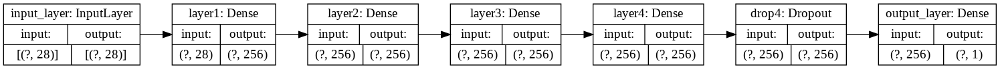

In [ ]:
#@title ##### Figure 6: Model structure and schematic for sample model

### set random seeds for reproducibility (same as above when importing libraries)
os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

### if using mirrored strategy for multi-GPU (**NOT EFFECTIVE ON COLAB**)
#strategy = tf.distribute.MirroredStrategy()
#print('Number of devices: {}'.format(strategy.num_replicas_in_sync))
#with strategy.scope():  # create model within MirroredStrategy scope to train on multi-GPU

### if using distributed strategy with TPU (**NOT EFFECTIVE ON COLAB**)
#try:
#  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
#  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
#except ValueError:
#  raise BaseException('ERROR: Not connected to a TPU runtime')
#tf.config.experimental_connect_to_cluster(tpu)
#tf.tpu.experimental.initialize_tpu_system(tpu)
#tpu_strategy = tf.distribute.TPUStrategy(tpu)
#with tpu_strategy.scope(): # create model within TPUStrategy scope to train on TPU

### compile model and summarize model structure
model = get_compiled_model(mod_name='SGD_base', optimizer='SGD')
model.summary()
keras.utils.plot_model(model, show_shapes=True, rankdir='LR')

During model fitting, we monitored the following **performance metrics** on the training and validation sets:

* Loss (from binary cross-entropy loss function)
* AUC (area under the ROC curve)
* Accuracy
* Precision
* Recall

Performance metrics on the validation set were of particular focus, with an emphasis on **detecting and avoiding over-fitting**.  Validation metrics were also used to **optimize hyper-parameters** along key design dimensions.  In order to prevent over-fitting, the training procedure that we implemented included an "early stopping" mechanism, whereby model fitting would terminate when the validation loss was no longer improving (with a minimum improvement threshold of 0.001 within 10 epochs).  We also used the Tensorboard tool in TensorFlow 
to visualize the model fitting process, as it provides a convenient dashboard with live plots of training and validation metrics.  An example Tensorboard view for the "SGD_base" model is shown in the Appendix.

Figure 7 displays the performance metrics (as a function of epoch) for the "SGD_base" model.  Epoch refers to a single pass through the entire training set during the model fitting process.  We see that the final fitted version of the model produced a loss of ~0.48 and an AUC of ~0.85, as measured on the validation data.  Total prediction accuracy was ~77%, while precision was ~77% and recall was ~81%.  Furthermore, the performance profile suggests no evidence of over-fitting.

In [ ]:
#@title
### save directories on GCS
local_log_path = '/tmp/log/'
gcs_log_path = 'gs://model_logs/' + model.name  #+ datetime.now().strftime('%Y%m%d-%H%M%S')
gcs_model_path = 'gs://models_saved/' + model.name  #+ datetime.now().strftime('%Y%m%d-%H%M%S')
gcs_history_path = 'gs://history_saved/' + model.name  #+ datetime.now().strftime('%Y%m%d-%H%M%S')

### load tensorboard 
#%load_ext tensorboard
#%tensorboard --logdir {gcs_log_path}

In [ ]:
#@title
### set random seeds for reproducibility (same as above when importing libraries)
os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

### callbacks during model fitting
callbacks = [### model checkpoint at end of each epoch
             #keras.callbacks.ModelCheckpoint(
             #    filepath=gcs_model_path + '_{epoch}',  
             #    monitor='val_loss', 
             #    verbose=1)
             ### tensorboard for monitoring training logs
             keras.callbacks.TensorBoard(
                 log_dir=gcs_log_path), 
             ### early stopping when no improvement
             keras.callbacks.EarlyStopping(
                 monitor='val_loss', 
                 min_delta=1e-3, 
                 patience=10, 
                 verbose=1, 
                 restore_best_weights=True)]

### train model 
start_time = datetime.now()
history = model.fit(train_ds, 
                    epochs=200, 
                    callbacks=callbacks, 
                    validation_data=val_ds)
fit_time = datetime.now() - start_time
print('Model ' + model.name + ' fitting time (hours): ' + str(round(fit_time.seconds / 3600, 2)))

### save final model & training history
model.save(gcs_model_path)
pd.DataFrame(history.history).to_csv(gcs_history_path + '/history.csv')

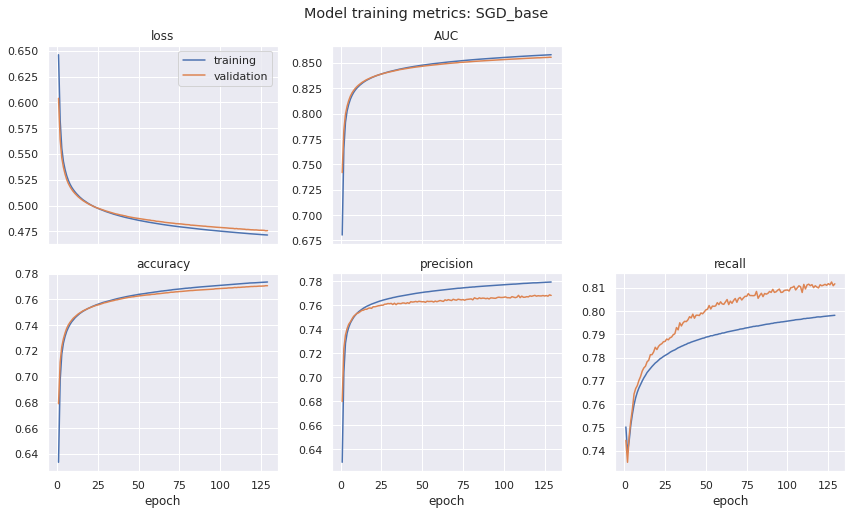

In [ ]:
#@title ##### Figure 7: Training and validation metrics for sample model
### plot training metrics
#history = pd.read_csv('gs://history_saved/SGD_base/history.csv', index_col=0)
plot_metrics(history)

Finally, the fitting time was monitored as a rough measure of **training efficiency**.  The fitting time is by no means an ideal metric, since it reflects not only model design and training efficiency, but also conditions outside our control, such as the time of day and time-varying characteristics of the computing platform like available capacity and utilization patterns.  However, it was helpful in yielding an order-of-magnitude comparison across different models.  This may be an important factor when training models that require multiple hours of training time in an environment where computing capacity is a finite and expensive resource.

#### Evaluation and performance metrics

In the final stage, we evaluated the fitted models on the test dataset.  Model performance was evaluated by reviewing and assessing:
* Training efficiency, which was a qualitative measure based on performance metrics achieved (on the validation data) versus training time
* Classification metrics (AUC, accuracy, precision, and recall) on the test set, with a primary focus on the AUC score as a measure of predictive ability
* ROC curves 
* Confusion matrix from predictions on the test data.



Table 3 presents performance metrics for the "SGD_base" model on the training, validation, and test sets, along with the training time (in hours).  We see that, from a training efficiency standpoint, the model achieved a validation AUC of 0.85 after 3.3 hours of training time.  By comparing the training / validation metrics to the test metrics, we observe that the model generalizes well to out-of-sample data, and yields comparable performance metrics across the training, validation, and test data.  For instance test metrics of ~0.85 AUC and 77% accuracy were nearly identical to the corresponding training and validation metrics.

In [ ]:
#@title ##### Table 3: Evaluation results for sample model
### display & save evaluation results
results = get_eval_results(model, train_ds, val_ds, test_ds, fit_time)
results.to_csv(gcs_history_path + '/results.csv')
#results = pd.read_csv('gs://history_saved/SGD_base/results.csv', index_col=0)
results

,training,validation,test
loss,0.4724,0.4766,0.4759
AUC,0.8577,0.8549,0.8553
accuracy,0.7726,0.7699,0.7703
precision,0.7707,0.7684,0.7685
recall,0.8126,0.8100,0.8108
time,NaN,NaN,3.3200


The primary metric used for evaluating model performance was the AUC score on the test set, which was ~0.85 for the "SGD_base" model.  The AUC score is generated from the applicable ROC curve, which summarizes predictive performance across a range of probability thresholds.  Figure 8 below illustrates the ROC curves for the sample model on the training, validation, and test sets.

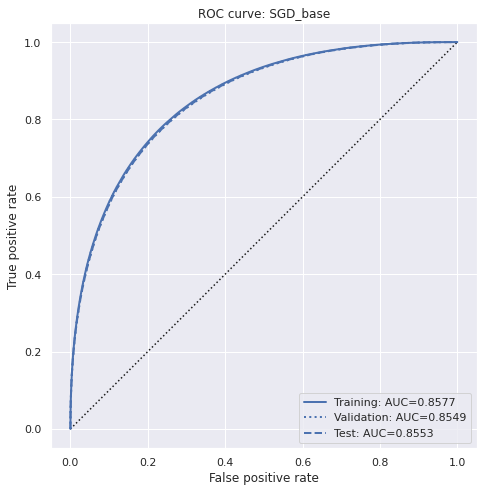

In [ ]:
#@title ##### Figure 8: ROC curves for sample model
### get model predictions on training, validation & test sets
#model = keras.models.load_model(gcs_model_path)
train_preds = model.predict(train_ds) 
val_preds = model.predict(val_ds)
test_preds = model.predict(test_ds)

### plot ROC curves for training, validation & test sets
fig, ax = plt.subplots(figsize=(12,7))
plt.plot([0,1], [0,1], 'k:')
plot_roc("Training", y_train, train_preds, color='b')
plot_roc("Validation", y_val, val_preds, color='b', linestyle=':')
plot_roc("Test", y_test, test_preds, color='b', linestyle='--')
plt.legend(loc='lower right')
plt.title("ROC curve: " + model.name)
plt.tight_layout()

Finally we reviewed the confusion matrix (contingency table) derived from predictions on the test set, which summarizes the predictive ability of the model on out-of-sample data.  Table 4 shows the confusion matrix for the sample model.  Consistent with the accuracy, precision, and recall metrics shown earlier, we see that the model predicts false positives and false negatives in roughly 23% of its predictions for the test data.

In [ ]:
#@title ##### Table 4: Confusion matrix (from test set) for sample model
### compute confusion matrix
get_conf_mat(y_test, test_preds)

Predicted class,0,1,Total
Actual class,,,
0,0.3407,0.1294,0.4701
1,0.1003,0.4296,0.5299
Total,0.4410,0.5590,1.0000


### Computing environment and software

All project work was completed within this notebook using the [Google Colaboratory](https://colab.research.google.com/notebooks/intro.ipynb) environment [13] with a Colab Pro subscription ($10 per month as of December 2020).  In this environment, I was able to access Colab GPU resources (such as NVIDIA Tesla V100) with high-memory runtimes (~ 25-30 gigabytes of available RAM), without having to address technical issues like back-end configuration and set-up of hardware resources.  In addition I used [Google Cloud Platform](https://cloud.google.com/gcp/getting-started) [14] and [Google Cloud Storage](https://cloud.google.com/storage/docs) [15] services for accessing and storing data, fitted models, training logs, and other model outputs.

For model development, I primarily used the deep learning framework provided by the [Keras](https://keras.io/getting_started/) [16] and [TensorFlow](https://www.tensorflow.org/) [17] libraries in Python.  Both libraries provided extensive tutorials and coding examples, which I leveraged throughout this project.  In addition, for the variable importance analysis, I used the [SHAP](https://shap.readthedocs.io/en/latest/) [18] library to compute and plot Shapley values.  Finally a couple resources that I found invaluable in learning and applying deep learning concepts were the book ["Deep Learning with Python"](https://www.manning.com/books/deep-learning-with-python) by Francois Chollet [19] and a [blog post](http://karpathy.github.io/2019/04/25/recipe/#2) on training neural networks by Andrej Karpathy [20]. 

---
## Results and discussion

In this section we present and discuss our modeling results.  We start by identifying our best classification model and evaluating its performance versus the benchmark models.  Then we compare performance of our best model and benchmark models on the low-level features versus high-level features of the dataset.  We conclude by quantifying the variable significance of the low-level and high-level features in the dataset.  As discussed in the Data section, the low-level features are the primary measurements (variables `X1` through `X21`) while the high-level features are the derived variables (`X22` through `X28`).

In [ ]:
#@title
### function used to fit & evaluate models, and then save results
def train_eval_model(seed=seed_value, features_kind='all', batch_size=512, 
                     lr=None, use_lr_sched=False, layer_depth=4, layer_width=256, 
                     act_fcn='tanh', l2_regularization=1e-5, dropout_rate=0.25, 
                     model_name='SGD_base', optimizer_alg='SGD', 
                     use_tensorboard=False): 
  '''function to set up datasets, get compiled model, train & evaluate model, and 
  save outputs
  Inputs: input parameters to various primary functions (defined above) including:
    seed = random seed
    features_kind = **'all'**, 'low', 'high' 
    batch_size = 64, 128, 256, **512**, 1024 
    lr = **None**, 1e-2, 1e-3, 1e-4 
        (SGD defaults to 1e-2, RMSprop & Adam default to 1e-3)
    use_lr_sched = **False**, True 
    layer_depth = 2, **4**, 6 
    layer_width = 64, 128, **256**, 512, 1024 
    act_fcn = **'tanh'**, 'relu', 'elu'
    l2_regularization = 1e-3, **1e-5**, 1e-7, 0
    dropout_rate = 0, **0.25**, 0.5
    model_name = 'SGD_base'
    optimizer_alg = **'SGD'**, 'RMSprop', 'Adam' 
    use_tensorboard = **False**, True
  Outputs: 
    tensorboard view of fitting process (if use_tensorboard=True)
    final model saved to GCS directory
    training history / metrics saved to GCS directory
    model evaluation saved to GCS directory
  '''
  ### set random seeds for reproducibility (same as above when importing libraries)
  print('\n*****************************************************')
  print('==> Train / evaluate model: starting new run ...')
  os.environ['PYTHONHASHSEED']=str(seed)
  random.seed(seed)
  np.random.seed(seed)
  tf.random.set_seed(seed)

  ### get datasets based on selected features and batchsize
  print('==> Train / evaluate model: getting datasets ...')
  train_ds, val_ds, test_ds = get_datasets(features=features_kind, batch=batch_size)

  ### get learning rate / schedule (if specified)
  learn = get_learning_rate(init_rate=lr, sched=use_lr_sched, batch=batch_size)

  ### get compiled model
  ### insert GPU/TPU distribution strategy here if using
  print('==> Train / evaluate model: getting compiled model ...')
  if learn is None:
    model = get_compiled_model(depth=layer_depth, width=layer_width, activation=act_fcn, 
                               l2_reg=l2_regularization, dropout=dropout_rate, 
                               features=features_kind, 
                               mod_name=model_name, optimizer=optimizer_alg) 
  else: 
    model = get_compiled_model(depth=layer_depth, width=layer_width, activation=act_fcn, 
                               l2_reg=l2_regularization, dropout=dropout_rate, 
                               features=features_kind,
                               mod_name=model_name, optimizer=optimizer_alg, 
                               learning_rate=learn) 

  ### save directories on GCS
  local_log_path = '/tmp/log/'
  gcs_log_path = 'gs://model_logs/' + model.name  #+ datetime.now().strftime('%Y%m%d-%H%M%S')
  gcs_model_path = 'gs://models_saved/' + model.name  #+ datetime.now().strftime('%Y%m%d-%H%M%S')
  gcs_history_path = 'gs://history_saved/' + model.name  #+ datetime.now().strftime('%Y%m%d-%H%M%S') 

  ### load tensorboard if needed
  if use_tensorboard: 
    %load_ext tensorboard 
    %tensorboard --logdir {gcs_log_path}

  ### callbacks during model fitting
  callbacks = [### model checkpoint at end of each epoch
              #keras.callbacks.ModelCheckpoint(
              #    filepath=gcs_model_path + '_{epoch}', 
              #    monitor='val_loss', 
              #    verbose=1),
              ### tensorboard for monitoring training logs
              keras.callbacks.TensorBoard(
                  log_dir=gcs_log_path), 
              ### early stopping when no improvement
              keras.callbacks.EarlyStopping(
                  monitor='val_loss', 
                  min_delta=1e-3,  # min threshold for improvement
                  patience=10,  # wait 10 epochs for improvement before stopping
                  verbose=1, 
                  restore_best_weights=True)]

  ### train model 
  print('==> Train / evaluate model: training model ' + model.name + ' ...')
  start_time = datetime.now()
  history = model.fit(train_ds, 
                      epochs=200, 
                      callbacks=callbacks, 
                      validation_data=val_ds)
  fit_time = datetime.now() - start_time
  print('==> Model ' + model.name + ' fitting time (hours): ' + str(round(fit_time.seconds / 3600, 2)))

  ### save final model & training history / metrics
  model.save(gcs_model_path)
  pd.DataFrame(history.history).to_csv(gcs_history_path + '/history.csv') 

  ### evaluate model & save results
  print('==> Train / evaluate model: evaluating model ...')
  results = get_eval_results(model, train_ds, val_ds, test_ds, fit_time)
  results.to_csv(gcs_history_path + '/results.csv')

In [ ]:
#@title
train_eval_model(model_name='SGD_base_all', features_kind='all')
train_eval_model(model_name='Adam_relu_l20_lr1e-3_all', optimizer_alg='Adam', act_fcn='relu', l2_regularization=0, lr=1e-3, features_kind='all')
train_eval_model(model_name='SGD_base_low', features_kind='low')
train_eval_model(model_name='Adam_relu_l20_lr1e-3_low', optimizer_alg='Adam', act_fcn='relu', l2_regularization=0, lr=1e-3, features_kind='low')
train_eval_model(model_name='SGD_base_high', features_kind='high')
train_eval_model(model_name='Adam_relu_l20_lr1e-3_high', optimizer_alg='Adam', act_fcn='relu', l2_regularization=0, lr=1e-3, features_kind='high')

### Best model

To determine at our best classification model, we started with 3 baseline models and then tuned hyper-parameters in successive fitting runs.  The 3 baseline models varied by optimization algorithm ("SGD" = stochastic gradient descent, "RMSprop" = root mean square propagation, and "Adam" = adaptive moment estimation), but were identical in other respects (other than the initial learning rate, which by Keras default was 0.01 for SGD and 0.001 for RMSprop and Adam).  See the "Model fitting" discussion above for a summary of the other key design dimensions and the assumptions made for the baseline models.  The baseline models were largely inspired by the model design described in Reference [5].

The tuning runs were chosen to vary a single hyper-parameter at a time, holding other design factors constant.  The sequence of tuning runs is listed below, together with the best model from each run:

* 0. Start with baseline models ("SGD_base", "RMSprop_base", and "Adam_base")
* 1. Test different **activation functions** (baseline = `tanh`)
  + A. Baseline models with `relu` activation function (the "relu models")
  + B. Baseline models with `elu` activation function
  + Best model: relu models
* 2. Test different **weight decay coefficients** for L2 regularization (baseline = 1e-5)
  + A. Relu models with L2 coefficient = 1e-3
  + B. Relu models with L2 coefficient = 1e-7
  + C. Relu models with L2 coefficient = 0 (the "relu models with L2=0")
  + Best model: relu models with L2=0
* 3. Test different **dropout fractions** for dropout regularization (baseline = 0.25)
  + A. Relu models with L2=0 and dropout fraction = 0.5
  + B. Relu models with L2=0 and dropout fraction = 0
  + Best model: relu models with L2=0 (with baseline dropout fraction = 0.25)
* 4. Test different **learning rates** (baseline = 1e-2 for SGD, 1e-3 for RMSprop and Adam)
  + A. Relu models with L2=0 and learning rate = 1e-2
  + B. Relu models with L2=0 and learning rate = 1e-3
  + C. Relu models with L2=0 and learning rate = 1e-4
  + D. Relu models with L2=0 and learning rate = 1e-2 with schedule
  + E. Relu models with L2=0 and learning rate = 1e-3 with schedule
  + F. Relu models with L2=0 and learning rate = 1e-4 with schedule
  + Best model: Adam relu model with L2=0 (with baseline learning rate = 1e-3) (the "Adam_best model")
* 5. Test different **hidden layer widths** (number of units/neurons) (baseline = 256)
  + Adam_best model with layer width = 64
  + Adam_best model with layer width = 128
  + Adam_best model with layer width = 512
  + Adam_best model with layer width = 1024
  + Best model: Adam_best model (with baseline width = 256)
* 6. Test different **hidden layer depths** (number of hidden layers) (baseline = 4)
  + Adam_best model with layer depth = 2
  + Adam_best model with layer depth = 6
  + Best model: Adam_best model (with baseline depth = 4)
* 7. Test different **batch sizes** (baseline = 512)
  + Adam_best model with batch size = 64
  + Adam_best model with batch size = 128
  + Adam_best model with batch size = 256
  + Adam_best model with batch size = 1024
  + Best model: Adam_best model (with baseline batch size = 512)

Each successive tuning run was conducted on the best model (or set of models) from the prior tuning run.  For instance, run #1 was done on all 3 baseline models from run #0; then run #2 was done on the baseline models with `relu` activation; then run #3 was done on the baseline models with `relu` activation and zero L2 regularization; and so on.  Models using the SGD, RMSprop and Adam optimization algorithms were kept in parallel through run #4, when the best model was chosen as the Adam model with `relu` activation and zero L2 regularization (and all other hyper-parameters equal to the baseline values).  This model, referred to as the **"Adam_best model"** was then used in runs #5, #6, and #7 to test different widths and depths of the hidden layers as well as batch sizes.  The end result of this tuning procedure was our final model -- the Adam_best model.  

Several points should be highlighted about the hyper-parameter tuning described above: 

* The best model (or set of models) in each run was chosen based on **validation metrics**, primarily the AUC score.  In some cases, the training time was also used as a secondary selection factor.  For example, in comparing two models where the validation AUC scores differed by a slight amount (e.g., 0.02) but the training times differed significantly (e.g., 2+ hours), the model with the lower AUC score and lower training time was chosen as the best model.
* In run #4, the last three iterations included a **learning rate schedule** in addition to the initial learning rate.  The schedule was an exponential decay schedule, which assumed a decay factor of 0.99 with each successive training epoch.  The purpose of including the schedule was to provide for a learning rate that gradually declines as training progresses, which is a feature often used in the literature.
* One of the hyper-parameters tested, the **batch size**, is not strictly speaking an attribute of the model design or architecture; rather it is an attribute of the batching algorithm used to expose subsets of the training data during each iteration of the model fitting procedure.  However the batch size influences the speed (or inversely, the number of training steps) involved in traversing the entire training set during each epoch of model fitting, so implicitly it affects the model learning rate.
* It is important to note that our choice of final model may be path-dependent based on the sequence of hyper-parameters tested.  In other words, because each tuning run tested a single factor at a time, had we chosen a different sequence of tuning runs, we could very well have ended up with a different best model.  A better -- but more computationally expensive -- way to tune hyper-parameters would be to **search the full hyper-parameter space**.  In our case this would be a 7-dimensional hyper-parameter space, which could be sampled using a specified grid of values (based on the range of test values above) or otherwise randomly sampled.  It likely may be the case that our chosen best model is only a local optimum point in the hyper-parameter space, rather than a global optimum point.
* All results of the tuning runs are shown in the **Appendix**.  Note that while the results include training, validation, and test metrics, the hyper-parameter decisions in each tuning run were based on the validation metrics (and sometimes secondarily on the training times).  The test set metrics were not used for hyper-parameter tuning.

Table 5 below summarizes the model design of our final model (Adam_best) versus the baseline models, which we use as a benchmark for comparison.  We see that the tuning procedure resulted in changing only 3 dimensions of the baseline model design (optimization algorithm, hidden layer activation function, and L2 regularization coefficient).

In [ ]:
#@title ##### Table 5: Model design of Adam_best versus baseline models
pd.DataFrame({'Hidden layer depth': [4, 4, 4, 4], 
 'Hidden layer width': [256, 256, 256, 256], 
 'Hidden layer activation': ['tanh', 'tanh', 'tanh', 'relu'], 
 'Output layer activation': ['sigmoid', 'sigmoid', 'sigmoid', 'sigmoid'], 
 'Loss function': ['binary cross-entropy', 'binary cross-entropy', 'binary cross-entropy', 'binary cross-entropy'], 
 'Optimization algorithm': ['SGD', 'RMSprop', 'Adam', 'Adam'], 
 'Learning rate': [0.01, 0.001, 0.001, 0.001], 
 'L2 regularization coefficient': [1e-5, 1e-5, 1e-5, 0], 
 'Dropout fraction': [0.25, 0.25, 0.25, 0.25], 
 'Batch size': [512, 512, 512, 512]}, 
 index=['SGD_base', 'RMSprop_base', 'Adam_base', 'Adam_best']).T


,SGD_base,RMSprop_base,Adam_base,Adam_best
Hidden layer depth,4,4,4,4
Hidden layer width,256,256,256,256
Hidden layer activation,tanh,tanh,tanh,relu
Output layer activation,sigmoid,sigmoid,sigmoid,sigmoid
Loss function,binary cross-entropy,binary cross-entropy,binary cross-entropy,binary cross-entropy
Optimization algorithm,SGD,RMSprop,Adam,Adam
Learning rate,0.01,0.001,0.001,0.001
L2 regularization coefficient,1e-05,1e-05,1e-05,0
Dropout fraction,0.25,0.25,0.25,0.25
Batch size,512,512,512,512


Table 6 summarizes the test metrics for our final model versus the baseline models.  The Adam_best model yields an improvement of 0.01 to 0.015 in AUC and 1% to 1.5% in accuracy compared to the baseline models.  Importantly, compared to the SGD_base model, the Adam_best model achieves better performance at a fraction of the compute time required for model training -- 1.2 hours versus 3.3 hours, or a reduction of roughly 65%.

In [ ]:
#@title ##### Table 6: Test metrics for Adam_best versus baseline models
(pd.concat([pd.read_csv('gs://history_saved/SGD_base/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_base/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_base/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_base', 'RMSprop_base', 'Adam_base', 'Adam_best'])
.xs('test', axis=1, level=1))

,SGD_base,RMSprop_base,Adam_base,Adam_best
loss,0.4759,0.4927,0.4904,0.4556
AUC,0.8553,0.8523,0.8512,0.8655
accuracy,0.7703,0.7650,0.7665,0.7804
precision,0.7685,0.7486,0.7685,0.7874
recall,0.8108,0.8380,0.8005,0.8021
time,3.3200,1.0300,0.8300,1.1500


Figure 9 shows the ROC curves for the Adam_best model versus the baseline models on the test set.  The curves demonstrate a clear (but somewhat marginal) improvement in classification performance by the Adam_best model.

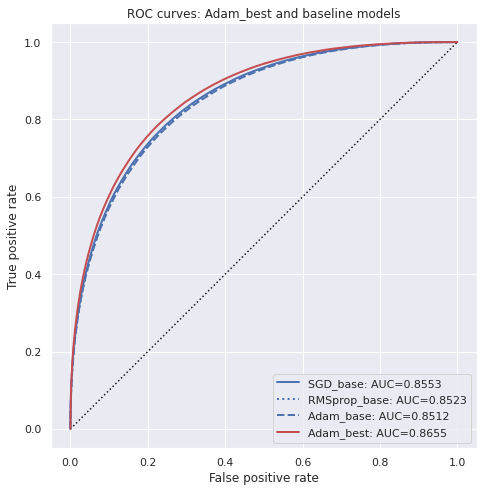

In [ ]:
#@title ##### Figure 9: ROC curves for Adam_best versus baseline models
### plot ROC curves for Adam_best & baseline models
# get models
SGD_base = keras.models.load_model('gs://models_saved/SGD_base')
RMSprop_base = keras.models.load_model('gs://models_saved/RMSprop_base')
Adam_base = keras.models.load_model('gs://models_saved/Adam_base')
Adam_best = keras.models.load_model('gs://models_saved/Adam_relu_l20_lr1e-3')
# make predictions on test data
SGD_preds = SGD_base.predict(test_ds)
RMSprop_preds = RMSprop_base.predict(test_ds)
Adam_preds = Adam_base.predict(test_ds)
Adam_best_preds = Adam_best.predict(test_ds)
# plot ROC curves
fig, ax = plt.subplots(figsize=(12,7))
plt.plot([0,1], [0,1], 'k:')
plot_roc("SGD_base", y_test, SGD_preds, color='b')
plot_roc("RMSprop_base", y_test, RMSprop_preds, color='b', linestyle=':')
plot_roc("Adam_base", y_test, Adam_preds, color='b', linestyle='--')
plot_roc("Adam_best", y_test, Adam_best_preds, color='r')
plt.legend(loc='lower right')
plt.title("ROC curves: Adam_best and baseline models")
plt.tight_layout()

The confusion matrix from the Adam_best model predictions on the test set is given in Table 7 below.  Our final model predicts false positives and false negatives across roughly 22% of the test data, which is an improvement compared to 23% for the SGD_base model (shown in Table 4 earlier).  Interestingly, the gain in overall accuracy is attributable to a lower rate of false positives (**greater precision**), although this is offset somewhat by a higher rate of false negatives (**weaker recall**), which is consistent with the test metrics shown in Table 6 above.

In [ ]:
#@title ##### Table 7: Confusion matrix (from test set) for Adam_best model
### compute confusion matrix
get_conf_mat(y_test, Adam_best_preds)

Predicted class,0,1,Total
Actual class,,,
0,0.3553,0.1148,0.4701
1,0.1049,0.4251,0.5299
Total,0.4602,0.5398,1.0000


### Model performance on low-level vs. high-level features

Now that we have selected our final model, we return to the question of whether all features are needed in order to produce the optimal classification performance on this dataset.  To answer the question, we start with the model designs provided by the Adam_best model and the SGD_base model, which we use as a benchmark.  For both model designs, we conduct model training on 3 subsets of the data: all features, only low-level features, and only high-level features.  After the models have been trained, we then evaluate classification performance on the test set.

The results of this analysis are shown in Table 8.  First, comparing the Adam_best models to the corresponding SGD_base models, we see that the Adam_best models are uniformly stronger than their SGD_base counterparts, across all test metrics including training time.  Second, we note that the Adam_best model trained on only the low-level features achieves virtually the same classification results as the Adam_best model trained on all the features, other than the training time.  For instance, the Adam_best model trained on the low-level features compared to the Adam_best model trained on all features scores approximately the same loss (0.4588 vs. 0.4586), the same AUC (0.8640 vs. 0.8643), and higher overall accuracy (0.7812 vs. 0.7787).  Furthermore, the Adam_best models trained on all features and only low-level features both perform significantly better than the Adam_best model trained on only high-level features.  The implications of these observations are three-fold:

* We have demonstrated that **with our strongest model, the high-level features are unnecessary** for classification.  Said differently, the Adam_best model trained on only the low-level features is able to learn the discriminatory information embedded in the high-level features, so that the high-level features are essentially redundant.
* However, only our strongest model is able to achieve the same classification power when trained on low-level features as when trained on all features.  For the benchmark models, the SGD_base model trained on only low-level features exhibits weaker performance compared to the SGD_base model trained on all features.  This points to the conclusion that a **weaker classification model benefits from the additional discriminatory information captured by the high-level features**, since it may be unable to learn this information directly from the low-level features.
* Finally we see that the **high-level features alone are insufficient to train a strong classifer**.  For both our strongest (Adam_best) and benchmark (SGD_base) models, classifiers trained on only the high-level features perform materially worse than those trained on all features or only low-level features.  This last point should not be surprising, since the high-level features comprise only 7 variables compared to the 21 variables of the low-level features.  Inevitably some discriminatory information is lost with the dimensionality reduction from 21 to 7 features.


In [ ]:
#@title ##### Table 8: Test metrics for Adam_best versus SGD_base models trained on all, low-level, and high-level features
summary = (pd.concat([pd.read_csv('gs://history_saved/SGD_base_all/results.csv', index_col=0), 
                      pd.read_csv('gs://history_saved/SGD_base_low/results.csv', index_col=0), 
                      pd.read_csv('gs://history_saved/SGD_base_high/results.csv', index_col=0), 
                      pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_all/results.csv', index_col=0), 
                      pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_low/results.csv', index_col=0), 
                      pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_high/results.csv', index_col=0)], 
                     axis=1, join='inner', keys=['SGD_base_all', 'SGD_base_low', 'SGD_base_high', 
                                                 'Adam_best_all', 'Adam_best_low', 'Adam_best_high'])
          .xs('test', axis=1, level=1))
summary.columns = pd.MultiIndex(levels=[['SGD_base', 'Adam_best'], ['All', 'Low', 'High']], codes=[[0,0,0,1,1,1], [0,1,2,0,1,2]])
summary

SGD_base                 Adam_best                
               All     Low    High       All     Low    High
loss        0.4759  0.5048  0.5501    0.4586  0.4588  0.5395
AUC         0.8553  0.8380  0.7923    0.8643  0.8640  0.7977
accuracy    0.7703  0.7573  0.7129    0.7787  0.7812  0.7170
precision   0.7685  0.7485  0.7255    0.7913  0.7861  0.7324
recall      0.8107  0.8163  0.7371    0.7910  0.8066  0.7344
time        3.4800  6.4200  1.5700    0.8500  1.4400  0.6800

Figure 10 plots the ROC curves for our final and benchmark models as trained on the 3 subsets of the data.  The ROC curves confirm our observations above, namely that (a) the low-level features alone are sufficient for training our strongest classifier (red dotted line versus red solid line), (b) they are not sufficient for training our benchmark classifier (blue dotted line versus blue solid line), and (c) the classifiers trained on only the high-level features perform substantially worse than the other classifiers (dashed red and blue lines versus the others).

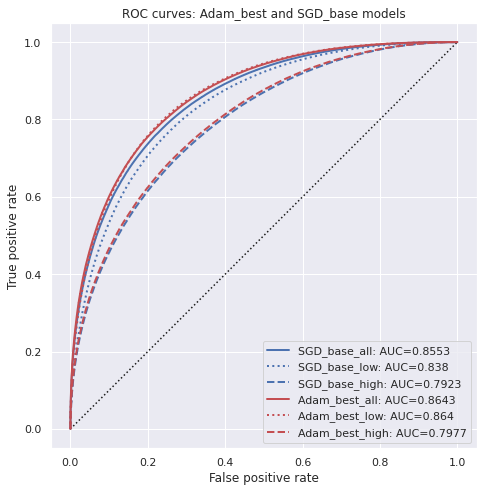

In [ ]:
#@title ##### Figure 10: ROC curves for Adam_best and SGD_base models trained on all, low-level, and high-level features
### plot ROC curves for Adam_best & SGD_base models trained on all, low & high features
# get models
SGD_base_all = keras.models.load_model('gs://models_saved/SGD_base_all')
SGD_base_low = keras.models.load_model('gs://models_saved/SGD_base_low')
SGD_base_high = keras.models.load_model('gs://models_saved/SGD_base_high')
Adam_best_all = keras.models.load_model('gs://models_saved/Adam_relu_l20_lr1e-3_all')
Adam_best_low = keras.models.load_model('gs://models_saved/Adam_relu_l20_lr1e-3_low')
Adam_best_high = keras.models.load_model('gs://models_saved/Adam_relu_l20_lr1e-3_high')
# make predictions on test data
_, _, test_ds_low = get_datasets(features='low')
_, _, test_ds_high = get_datasets(features='high')
SGD_all_preds = SGD_base_all.predict(test_ds)
SGD_low_preds = SGD_base_low.predict(test_ds_low)
SGD_high_preds = SGD_base_high.predict(test_ds_high)
Adam_all_preds = Adam_best_all.predict(test_ds)
Adam_low_preds = Adam_best_low.predict(test_ds_low)
Adam_high_preds = Adam_best_high.predict(test_ds_high)
# plot ROC curves
fig, ax = plt.subplots(figsize=(12,7))
plt.plot([0,1], [0,1], 'k:')
plot_roc("SGD_base_all", y_test, SGD_all_preds, color='b')
plot_roc("SGD_base_low", y_test, SGD_low_preds, color='b', linestyle=':')
plot_roc("SGD_base_high", y_test, SGD_high_preds, color='b', linestyle='--')
plot_roc("Adam_best_all", y_test, Adam_all_preds, color='r')
plot_roc("Adam_best_low", y_test, Adam_low_preds, color='r', linestyle=':')
plot_roc("Adam_best_high", y_test, Adam_high_preds, color='r', linestyle='--')
plt.legend(loc='lower right')
plt.title("ROC curves: Adam_best and SGD_base models")
plt.tight_layout()

### Variable importance in low-level and high-level features

A natural question to ask at this point is, "What are the most important features in this dataset?"  In other words, which features (from `X1` to `X28`) play the biggest role in determining whether an observation is a signal or background event?  It is worth noting that deep learning methods are sometimes criticized for resembling "black box" models, since the inner mechanics of neural networks may seem to be hidden from view, as compared to other statistical learning methods such as regression or decision trees.  In order to provide some intuition and gain an understanding of variable significance in our model, we turn to a methodology for interpreting model outputs in terms of Shapley values.  We apply this methodology to our final model using the [SHAP](https://shap.readthedocs.io/en/latest/) [18] library.

As described in the SHAP library documentation, the Shapley value is a statistical measure that quantifies the effect of an input feature and its contribution to output predictions within a given model.  It can be computed for a variety of machine learning methods, including deep learning.  In this last stage of our project, we used Shapley values in order to identify the key driving variables in the dataset and measure their significance in our final model.

Figure 11 displays the Shapley values (left plot) and variable importance (right plot) for the Adam_best model as trained on all features.  The Shapley values shown on the left indicate the contribution of each variable to the final output values (log-odds predictions, prior to logistic transformation into probability predictions).  Each dot represents an individual observation, with positive (or negative) Shapley values representing positive (or negative) contributions to the output values, and the variables are sorted by the relative magnitude of their Shapley values.  The chart on the right takes the mean absolute value of the Shapley values for each variable, and interprets this as the relative importance of each variable in the model.

From Figure 11, we see that within our final model as trained on all the features in the dataset, the most important variables are largely the high-level features.  They account for 3 of the top 5 (and 6 of the top 10) variables in terms of their impact in the model.  This is not surprising, as we saw from the univariate (Figures 1 and 2) and bivariate distributions (Figures 3 and 4) in the Data section that the high-level features (particularly `X26`, `X27`, `X28`) generally exhibited stronger separability between signal and background events as compared to the low-level features.  Furthermore, the significance scores drop off sharply outside of the top ~12 variables, which suggests the variable significance is highly concentrated in these features.

In [ ]:
#@title
### function to compute & plot feature importance
def plot_var_imp(features='all', sample_size=1e3, backgrd_size=100, seed_value=seed_value):
  '''function to compute and plot SHAP values & variable importance
  based on subset of data features
  inputs:
    features = 'all', 'low', 'high'
    sample_size = size of sample to use for computing SHAP values relative to background
    backgrd_size = 100 or 1000 = size of sample to use as background expectation value
  ouputs: plot of SHAP values and variable importance
  '''
  # get sample data from x_train and background data for SHAP calc
  X = ( (x_train.loc[:, :'X21'] if features=='low' 
         else (x_train.loc[:, 'X22': ] if features=='high' else x_train))
      .sample(int(sample_size), random_state=seed_value).to_numpy() )
  col_names = ( x_train.columns[ :21] if features=='low' else 
               (x_train.columns[21: ] if features=='high' else x_train.columns) )
  title = features + ('' if features=='all' else '-level')
  background = X[np.random.choice(X.shape[0], int(backgrd_size), replace=False)]
  # get Adam_best model as trainined on 'all', 'low', or 'high' subset of features
  model = keras.models.load_model('gs://models_saved/Adam_relu_l20_lr1e-3_' + features)
  # compute SHAP values
  explainer = shap.DeepExplainer(model, background)
  shap_values = explainer.shap_values(X)[0]
  # plot SHAP values & variable importance
  fig = plt.figure(figsize=(12,7))
  plt.subplot(121)
  shap.summary_plot(shap_values, X, feature_names=col_names, 
                    show=False, plot_size=None)
  plt.subplot(122)
  shap.summary_plot(shap_values, X, feature_names=col_names, plot_type="bar", 
                    show=False, plot_size=None)
  plt.suptitle('Shapley values & variable importance for Adam_best on ' + 
               title + ' features', y=1.02)
  plt.tight_layout()

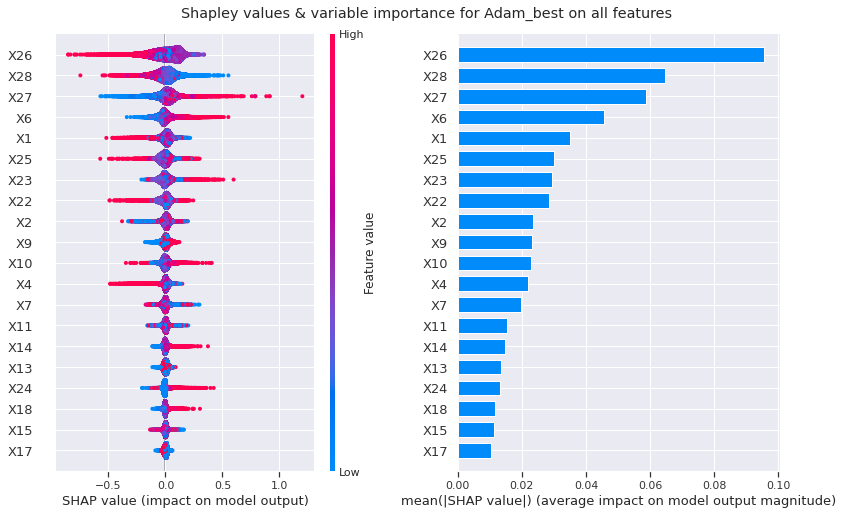

In [ ]:
#@title ##### Figure 11: Variable importance for final model trained on all features
# variable importance for all features
plot_var_imp(features='all', sample_size=1e5)

Figure 12 below shows the Shapley values and variable importance for our final model as trained on only the low-level features.  Without the influence of the high-level features, we see a number of variables come to the fore, which previously did not appear to be significant in Figure 11.  For instance, `X8` and `X12` did not even place in the top 20 variables overall in Figure 11, but they land in the top 5 variables in Figure 12 once the high-level features are removed.  This suggests that some of the explanatory information in the high-level features may be captured in these variables.  Further, by inspecting the correlation heatmap from Figure 5, we see that `X1`, `X6`, and `X10` exhibit correlations with `X26`, `X27`, and `X28` that vary depending on the target class, which suggests they may also include discriminatory information captured by the high-level features. Finally, it is interest to note that variable significance is less concentrated in Figure 12 than it is in Figure 11, which suggests that when the high-level features are removed from the dataset, the model draws on a larger set of variables for classification information; or said differently, more variables are required to compensate for the loss of information reflected in the high-level features.


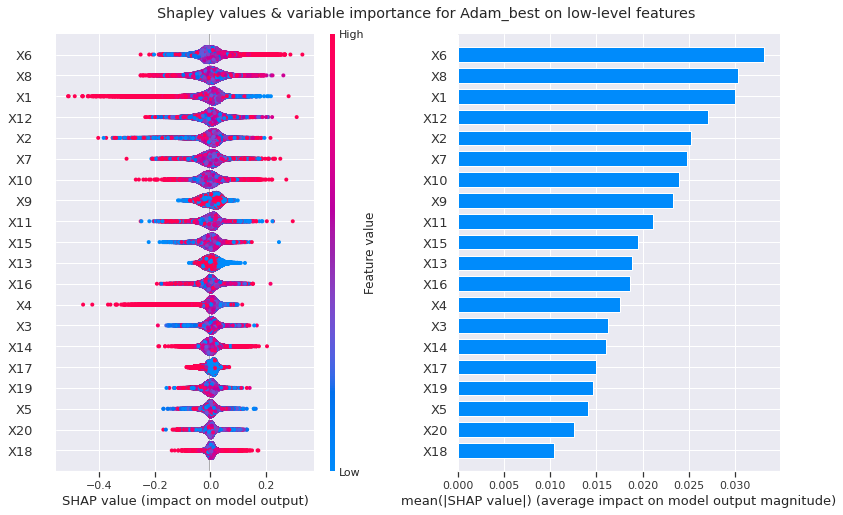

In [ ]:
#@title ##### Figure 12: Variable importance for final model trained on low-level features
# variable importance for low-level features
plot_var_imp(features='low', sample_size=1e5)

Lastly Figure 13 below shows the Shapley values and variable importance for our final model as trained on the high-level features alone.  As expected, `X26`, `X27`, and `X28` are at the top of the list, since they dominate all other features by variable importance, as seen in Figure 11 earlier.

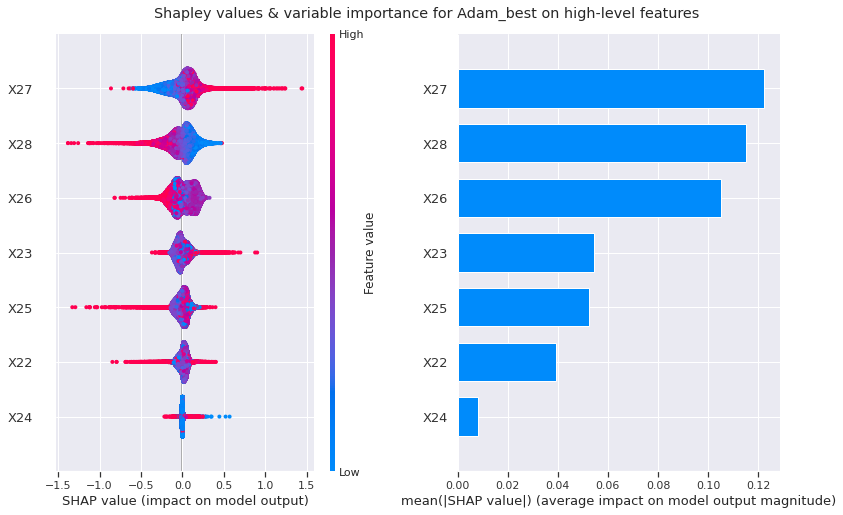

In [ ]:
#@title ##### Figure 13: Variable importance for final model trained on high-level features
# variable importance for high-level features
plot_var_imp(features='high', sample_size=1e5)

---
## Conclusion

In this project we worked with the Higgs dataset, a binary classification dataset of 11 million observations of high-energy physics interactions relating to the Higgs particle.  We developed a variety of deep learning models using the Keras framework in the Google Colaboratory environment.  These models were fitted on the training data and then evaluated for their predictive performance on the test data.  Our findings and suggestions for further work are described below.

### Findings

* We started with a set of benchmark models with somewhat generic design features, although they were loosely adapted from the model description given in Reference [5].  Surprisingly, **the benchmark models performed relatively well**.  For instance, the SGD_base model achieved an AUC of 0.855 and accuracy of 77% on the test data.
* After hyper-parameter tuning across key design factors, we arrived at our best model, **the Adam_best model**.  This model achieved an **AUC of 0.866 and accuracy of 78%** on the test data, which represents only modest improvement in classification performance versus the benchmark models (a gain of approximately 0.01 to 0.015 in AUC and 1% to 1.5% in accuracy).  However our final model was **significantly more efficient in model fitting**, requiring only a fraction of the compute time required for training (roughly 1 hour) compared to the benchmark models.
* The fact that our best model is only modestly better than our benchmark models can be interpreted in two ways (and both interpretations are likely true to some extent):
  + Deep learning is a powerful statistical framework, which is capable of discerning patterns in a high-dimensional dataset provided that the models are suitably flexible (i.e., have sufficient layer width and depth).  With over 205K parameters to be fitted, even **the benchmark models have ample degrees of freedom to learn complex patterns** in the data reasonably well.
  + It is likely that our hyper-parameter tuning was not efficient in finding the global optimum, and so **our final model may not represent the best model achievable** within the given hyper-parameter space.  As highlighted in the results section, we followed a sequential path in tuning the final model, whereas a more systematic search of the hyper-parameter space (by varying the hyper-parameters simultaneously) would be better equipped to find the optimal model.
* We trained our final model design on subsets of the predictors, including all features, only low-level features, and only high-level features.  Our best model had comparable performance on the test data when it was trained on all features versus when it was trained on the low-level features alone.  This implies that our strongest model was able to learn -- directly from the low-level features -- the discriminatory information contained in the high-level features; in this case the **high-level features are redundant**.
* We assessed variable importance in our final model when trained on the same subsets of the predictors (all features, only low-level features, and only high-level features).  When the model was trained on all features, variable significance was concentrated and largely attributable to the high-level features.  However, when the high-level features were removed and the model was trained on only the low-level features, variable significance was distributed more broadly across the feature set, as the model relied on **other predictors to compensate for the loss of information reflected in the high-level features**.

### Suggestions for further work

Suggestions to expand on the work of this project include the following:

* Explore the **explanatory significance of key features** in the model using the Shapley methodology.  While we were able to use Shapley values to quantify and summarize variable importance in our final model, the Shapley methodology can be used more generally to trace the impact of individual feature contributions to specific predictions.  Illustrating the influence of individual predictors would help to enhance the interpretability of deep learning models.  
* Improve the **hyper-parameter tuning process** as discussed above, by conducting a more systematic and comprehensive search of the hyper-parameter space.  This has the potential to be extremely time-consuming and expensive in computing resources. A tool that would be worthwhile to explore in this case is Keras Tuner.
* Investigate the roles of **learning rate schedules** and **momentum**, and evaluate their effectiveness in improving classification performance.  For lack of time, we tried only a basic exponential learning schedule in this project, which turned out to be ineffective.  However both features are often used in the literature to improve performance.
* Construct and evaluate **ensembles of deep learning models**.  Ensembles provide the means to leverage the collective learning of multiple models, and from the literature, are often used to gain incremental performance versus solitary deep learning models.  In addition, using ensemble models helps mitigate reproducibility issues arising from randomization in different components of the deep learning models.
* Leverage **multi-GPU and/or TPU resources** to speed up the model training and tuning process.  Such resources are available on the GCP platform, but require technical set-up and configuration.


---
## References

[1] Farbin, A. "Deep Learning in High Energy Physics."  Harvard University Center of Mathematical Sciences and Applications, https://cmsa.fas.harvard.edu/amir-farbin-deep-learning-in-high-energy-physics/, 2016.

[2] Inter-Experimental LHC Machine Learning Working Group.  HEP-ML Resources GitHub repository, https://github.com/iml-wg/HEP-ML-Resources.

[3] Albertsson, K., P. Altoe, D. Anderson, et. al.  "Machine Learning in High Energy Physics Community White Paper."  Journal of Physics: Conf. Series 1085 (2018).

[4] Guest, D., K Cranmer, and D Whiteson.  "Deep Learning and Its Application to LHC Physics."  Annual Review of Nuclear and Particle Science 2018 (68:1-22).

[5] Baldi, P., P. Sadowski, and D. Whiteson.  “Searching for exotic particles in high-energy physics with deep learning.”  Nature Communications 5 (July 2, 2014).  

[6] Ojika, D., D. Acosta, A. Gordon-Ross, et. al.  "Accelerating High-energy Physics Exploration with Deep Learning."  PEARC17: Proceedings of the Practice and Experience in Advanced Research Computing 2017, Article Number 37.

[7] Strong, G.  "On the impact of selected modern deep-learning techniques to the performance and celerity of classificaiton models in an experimental high-energy physics use case."  Machine Learning: Science and Technology 1 (2020).

[8] Racah, E., S. Ko, P. Sadowski, et.al.  "Revealing Fundamental Physics from the Daya Bay Neutrino Experiment using Deep Neural Networks."  arXiv preprint arXiv:1601.07621v3 [stat.ML], 6 Dec 2016. 

[9] de Oliveira, L., M. Kagan, L. Mackey, et.al. "Jet-Images -- Deep Learning Edition."  arXiv preprint arXiv:1511.05190v3 [hep-ph], 22 Jan 2017.

[10] Andrews, M., M. Paulini, S. Gleyzer, et. al.  "End-to-End Physics Event Classification with CMS Open Data."  arXiv preprint arXiv:1807.11916v2 [hep-ex], 24 Jul 2019.

[11] Brehmer, J., K. Cranmer, G. Louppe, et. al.  "A guide to constraining effective field theories with machine learning."  Physical Review D 98, 052004 (2018).

[12] Crispim Romao, M., N. Castro, J. Milhano, et. al.  "Use of a Generalized Energy Mover's Distance in the Search for Rare Phenomena at Colliders."  arXiv preprint arXiv:2004.09360v1 [hep-ph], 20 Apr 2020.

[13] Google Colaboratory, https://colab.research.google.com/notebooks/intro.ipynb.

[14] Google Cloud Platform (GCP), https://cloud.google.com/gcp/getting-started.

[15] Google Cloud Storage (GCS), https://cloud.google.com/storage/docs.

[16] Keras, https://keras.io/getting_started/.

[17] TensorFlow, https://www.tensorflow.org/.

[18] SHAP, https://shap.readthedocs.io/en/latest/.

[19] Chollet, F.  "Deep Learning with Python."  Manning Publications, https://www.manning.com/books/deep-learning-with-python, 2017.

[20] Karpathy, A. "A Recipe for Training Neural Networks", http://karpathy.github.io/2019/04/25/recipe/#2, 2019.



---
## Appendix

In [ ]:
#@title ##### Table 9: Correlation matrix of the feature variables
tb = widgets.TabBar(tabs)
for i in range(len(tabs)):
  with tb.output_to(i, select=False):
    print('Correlation matrix: ' + tabs[i])
    display(corrmat[i])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Correlation matrix: All


,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28
X1,1.00,-0.00,-0.00,-0.14,0.00,0.17,-0.00,-0.00,-0.01,0.00,0.00,0.00,-0.01,-0.01,0.00,0.00,0.01,-0.02,0.00,-0.00,0.00,0.03,0.02,0.27,0.13,0.01,0.10,0.14
X2,-0.00,1.00,0.00,-0.00,0.00,-0.00,0.26,-0.00,0.00,0.00,0.26,-0.00,-0.00,0.00,0.23,-0.00,0.00,0.00,0.18,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00
X3,-0.00,0.00,1.00,-0.00,-0.04,-0.00,0.00,-0.17,-0.00,-0.00,0.00,-0.09,0.00,-0.00,0.00,-0.08,-0.00,-0.00,0.00,-0.07,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00
X4,-0.14,-0.00,-0.00,1.00,-0.00,0.20,-0.00,-0.00,-0.03,0.04,0.00,0.00,-0.01,0.02,-0.00,0.00,0.01,0.00,-0.00,-0.00,0.01,0.03,0.03,0.17,0.28,0.03,0.21,0.30
X5,0.00,0.00,-0.04,-0.00,1.00,0.00,-0.00,-0.15,0.00,0.00,-0.00,-0.06,-0.00,0.00,-0.00,-0.05,0.00,0.00,-0.00,-0.04,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00
X6,0.17,-0.00,-0.00,0.20,0.00,1.00,-0.00,-0.00,-0.02,0.49,0.00,-0.00,-0.03,0.27,-0.00,0.00,-0.03,0.16,0.00,-0.00,-0.01,0.19,0.26,0.02,0.28,0.34,0.48,0.45
X7,-0.00,0.26,0.00,-0.00,-0.00,-0.00,1.00,0.00,-0.00,-0.00,0.25,0.00,-0.00,0.00,0.23,-0.00,0.00,0.00,0.19,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
X8,-0.00,-0.00,-0.17,-0.00,-0.15,-0.00,0.00,1.00,0.00,-0.00,-0.00,-0.20,0.00,0.00,-0.00,-0.13,-0.00,0.00,-0.00,-0.10,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00
X9,-0.01,0.00,-0.00,-0.03,0.00,-0.02,-0.00,0.00,1.00,-0.14,0.00,-0.00,-0.26,-0.15,-0.00,0.00,-0.26,-0.15,-0.00,-0.00,-0.23,-0.12,-0.07,0.00,0.13,0.27,0.11,0.00
X10,0.00,0.00,-0.00,0.04,0.00,0.49,-0.00,-0.00,-0.14,1.00,-0.00,-0.00,0.14,0.29,-0.00,0.00,-0.05,0.19,-0.00,-0.00,-0.03,0.18,0.26,0.00,0.20,0.37,0.43,0.38


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Correlation matrix: y=0


,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28
X1,1.00,-0.00,-0.00,-0.14,0.00,0.26,-0.00,-0.00,-0.05,0.07,-0.00,-0.00,-0.02,0.05,0.00,0.00,0.02,0.03,-0.00,0.00,0.03,0.04,0.04,0.28,0.17,0.02,0.15,0.20
X2,-0.00,1.00,0.00,-0.00,0.00,-0.00,0.23,-0.00,0.00,0.00,0.22,-0.00,0.00,0.00,0.17,-0.00,-0.00,0.00,0.12,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00
X3,-0.00,0.00,1.00,-0.00,-0.02,-0.00,0.00,-0.17,-0.00,-0.00,0.00,-0.11,-0.00,0.00,0.00,-0.10,0.00,-0.00,0.00,-0.08,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00
X4,-0.14,-0.00,-0.00,1.00,-0.00,0.27,-0.00,0.00,-0.06,0.08,0.00,-0.00,-0.02,0.05,-0.00,-0.00,0.02,0.03,-0.00,0.00,0.03,0.05,0.05,0.11,0.30,0.02,0.24,0.34
X5,0.00,0.00,-0.02,-0.00,1.00,0.00,-0.00,-0.16,-0.00,0.00,-0.00,-0.09,-0.00,-0.00,-0.00,-0.07,0.00,-0.00,-0.00,-0.06,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
X6,0.26,-0.00,-0.00,0.27,0.00,1.00,-0.00,-0.00,0.07,0.49,0.00,-0.00,-0.01,0.25,-0.00,0.00,-0.05,0.14,0.00,-0.00,-0.04,0.17,0.25,0.03,0.36,0.45,0.58,0.55
X7,-0.00,0.23,0.00,-0.00,-0.00,-0.00,1.00,0.00,0.00,-0.00,0.26,0.00,0.00,-0.00,0.24,-0.00,0.00,0.00,0.21,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00
X8,-0.00,-0.00,-0.17,0.00,-0.16,-0.00,0.00,1.00,-0.00,0.00,-0.00,-0.18,0.00,0.00,0.00,-0.12,-0.00,0.00,-0.00,-0.09,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00
X9,-0.05,0.00,-0.00,-0.06,-0.00,0.07,0.00,-0.00,1.00,-0.03,-0.00,-0.00,-0.22,-0.08,0.00,0.00,-0.27,-0.10,-0.00,0.00,-0.27,-0.10,-0.03,0.01,0.14,0.32,0.17,0.03
X10,0.07,0.00,-0.00,0.08,0.00,0.49,-0.00,0.00,-0.03,1.00,0.00,-0.00,0.15,0.29,-0.00,0.00,-0.08,0.16,0.00,-0.00,-0.07,0.17,0.26,0.02,0.23,0.49,0.51,0.44


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Correlation matrix: y=1


,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28
X1,1.00,-0.00,0.00,-0.16,-0.00,0.08,-0.00,-0.00,0.04,-0.06,0.00,0.00,0.01,-0.07,0.00,-0.00,-0.01,-0.07,0.00,-0.00,-0.03,0.01,-0.01,0.27,0.08,-0.04,0.02,0.05
X2,-0.00,1.00,0.00,-0.00,0.00,-0.00,0.30,-0.00,0.00,-0.00,0.31,-0.00,-0.00,0.00,0.28,0.00,0.00,0.00,0.23,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00
X3,0.00,0.00,1.00,0.00,-0.06,0.00,0.00,-0.17,0.00,-0.00,0.00,-0.08,0.00,-0.00,0.00,-0.07,-0.00,0.00,0.00,-0.05,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00
X4,-0.16,-0.00,0.00,1.00,-0.00,0.14,0.00,-0.00,-0.00,0.01,0.00,0.00,0.01,-0.01,-0.00,0.00,-0.00,-0.01,0.00,-0.00,-0.01,0.02,0.02,0.24,0.25,-0.01,0.16,0.22
X5,-0.00,0.00,-0.06,-0.00,1.00,-0.00,-0.00,-0.15,-0.00,0.00,0.00,-0.04,-0.00,0.00,-0.00,-0.03,0.00,0.00,-0.00,-0.02,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00
X6,0.08,-0.00,0.00,0.14,-0.00,1.00,-0.00,-0.00,-0.09,0.48,-0.00,-0.00,-0.04,0.28,-0.00,-0.00,0.00,0.18,0.00,-0.00,0.02,0.20,0.27,0.00,0.20,0.23,0.40,0.38
X7,-0.00,0.30,0.00,0.00,-0.00,-0.00,1.00,0.00,-0.00,-0.00,0.23,0.00,-0.00,0.00,0.22,0.00,0.00,0.00,0.18,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00
X8,-0.00,-0.00,-0.17,-0.00,-0.15,-0.00,0.00,1.00,0.00,-0.00,-0.00,-0.22,0.00,0.00,-0.00,-0.15,-0.00,0.00,-0.00,-0.11,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00
X9,0.04,0.00,0.00,-0.00,-0.00,-0.09,-0.00,0.00,1.00,-0.23,0.00,-0.00,-0.30,-0.21,-0.00,0.00,-0.24,-0.19,-0.00,-0.00,-0.20,-0.13,-0.10,-0.00,0.13,0.22,0.05,-0.02
X10,-0.06,-0.00,-0.00,0.01,0.00,0.48,-0.00,-0.00,-0.23,1.00,-0.00,0.00,0.13,0.30,0.00,0.00,-0.01,0.20,-0.00,0.00,0.01,0.20,0.27,-0.01,0.18,0.25,0.37,0.34


<IPython.core.display.Javascript object>

In [ ]:
#@title ##### Figure 14: Tensorboard view of sample model training
# show tensorboard example
%load_ext tensorboard
%tensorboard --logdir {'gs://model_logs/SGD_base'}

<IPython.core.display.Javascript object>

In [ ]:
#@title ##### Table 10: Tuning run #0: baseline models
pd.concat([pd.read_csv('gs://history_saved/SGD_base/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_base/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_base/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_base', 'RMSprop_base', 'Adam_base'])

SGD_base                     ... Adam_base                   
          training validation    test  ...  training validation    test
loss        0.4724     0.4766  0.4759  ...    0.4875     0.4903  0.4904
AUC         0.8577     0.8549  0.8553  ...    0.8531     0.8512  0.8512
accuracy    0.7726     0.7699  0.7703  ...    0.7685     0.7668  0.7665
precision   0.7707     0.7684  0.7685  ...    0.7705     0.7690  0.7685
recall      0.8126     0.8100  0.8108  ...    0.8021     0.8005  0.8005
time           NaN        NaN  3.3200  ...       NaN        NaN  0.8300

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 11: Tuning run #1A: baseline models with relu activation
pd.concat([pd.read_csv('gs://history_saved/SGD_relu/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu', 'RMSprop_relu', 'Adam_relu'])

SGD_relu                     ... Adam_relu                   
          training validation    test  ...  training validation    test
loss        0.4594     0.4684  0.4682  ...    0.4690     0.4720  0.4716
AUC         0.8660     0.8602  0.8603  ...    0.8627     0.8609  0.8610
accuracy    0.7801     0.7749  0.7745  ...    0.7777     0.7761  0.7759
precision   0.7748     0.7703  0.7697  ...    0.7864     0.7850  0.7845
recall      0.8247     0.8196  0.8197  ...    0.7969     0.7953  0.7956
time           NaN        NaN  2.7900  ...       NaN        NaN  0.9600

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 12: Tuning run #1B: baseline models with elu activation
pd.concat([pd.read_csv('gs://history_saved/SGD_elu/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_elu/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_elu/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_elu', 'RMSprop_elu', 'Adam_elu'])

SGD_elu                     ... Adam_elu                   
          training validation    test  ... training validation    test
loss        0.4783     0.4815  0.4813  ...   0.4788     0.4810  0.4809
AUC         0.8539     0.8516  0.8517  ...   0.8595     0.8582  0.8581
accuracy    0.7692     0.7673  0.7674  ...   0.7747     0.7735  0.7734
precision   0.7711     0.7695  0.7692  ...   0.7841     0.7832  0.7828
recall      0.8029     0.8009  0.8017  ...   0.7932     0.7919  0.7921
time           NaN        NaN  3.1000  ...      NaN        NaN  1.0200

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 13: Tuning run #2A: relu models with L2 coefficient=1e-3
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l21e-3/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l21e-3/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l21e-3/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l21e-3', 'RMSprop_relu_l21e-3', 'Adam_relu_l21e-3'])

SGD_relu_l21e-3             ... Adam_relu_l21e-3        
                 training validation  ...       validation    test
loss               0.5342     0.5351  ...           0.5459  0.5457
AUC                0.8375     0.8368  ...           0.8238  0.8239
accuracy           0.7536     0.7527  ...           0.7426  0.7428
precision          0.7453     0.7448  ...           0.7548  0.7547
recall             0.8126     0.8115  ...           0.7618  0.7624
time                  NaN        NaN  ...              NaN  0.3400

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 14: Tuning run #2B: relu models with L2 coefficient=1e-7
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l21e-7/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l21e-7/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l21e-7/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l21e-7', 'RMSprop_relu_l21e-7', 'Adam_relu_l21e-7'])

SGD_relu_l21e-7             ... Adam_relu_l21e-7        
                 training validation  ...       validation    test
loss               0.4563     0.4647  ...           0.4610  0.4603
AUC                0.8641     0.8587  ...           0.8631  0.8634
accuracy           0.7783     0.7734  ...           0.7782  0.7782
precision          0.7759     0.7715  ...           0.7867  0.7864
recall             0.8180     0.8133  ...           0.7976  0.7983
time                  NaN        NaN  ...              NaN  0.6500

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 15: Tuning run #2C: relu models with L2 coefficient=0
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20', 'RMSprop_relu_l20', 'Adam_relu_l20'])

SGD_relu_l20                     ... Adam_relu_l20                   
              training validation    test  ...      training validation    test
loss            0.4553     0.4643  0.4641  ...        0.4452     0.4581  0.4576
AUC             0.8648     0.8590  0.8591  ...        0.8714     0.8642  0.8644
accuracy        0.7789     0.7737  0.7735  ...        0.7855     0.7793  0.7795
precision       0.7752     0.7706  0.7700  ...        0.7918     0.7859  0.7861
recall          0.8209     0.8157  0.8163  ...        0.8075     0.8019  0.8022
time               NaN        NaN  2.6600  ...           NaN        NaN  0.9900

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 16: Tuning run #3A: relu models with L2=0 and dropout=0.5
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_drop0.5/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_drop0.5/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_drop0.5/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_drop0.5', 'RMSprop_relu_l20_drop0.5', 'Adam_relu_l20_drop0.5'])

SGD_relu_l20_drop0.5             ... Adam_relu_l20_drop0.5        
                      training validation  ...            validation    test
loss                    0.4570     0.4656  ...                0.4620  0.4613
AUC                     0.8640     0.8584  ...                0.8616  0.8619
accuracy                0.7778     0.7725  ...                0.7766  0.7768
precision               0.7702     0.7656  ...                0.7857  0.7859
recall                  0.8277     0.8225  ...                0.7953  0.7955
time                       NaN        NaN  ...                   NaN  0.6600

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 17: Tuning run #3B: relu models with L2=0 and dropout=0
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_drop0/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_drop0/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_drop0/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_drop0', 'RMSprop_relu_l20_drop0', 'Adam_relu_l20_drop0'])

SGD_relu_l20_drop0             ... Adam_relu_l20_drop0        
                    training validation  ...          validation    test
loss                  0.4538     0.4638  ...              0.4593  0.4593
AUC                   0.8659     0.8594  ...              0.8637  0.8636
accuracy              0.7801     0.7740  ...              0.7787  0.7781
precision             0.7760     0.7705  ...              0.7910  0.7901
recall                0.8226     0.8168  ...              0.7916  0.7916
time                     NaN        NaN  ...                 NaN  0.6100

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 18: Tuning run #4A: relu models with L2=0 and learning rate=1e-2
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_lr1e-2/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_lr1e-2/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-2/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_lr1e-2', 'RMSprop_relu_l20_lr1e-2', 'Adam_relu_l20_lr1e-2'])

SGD_relu_l20_lr1e-2             ... Adam_relu_l20_lr1e-2        
                     training validation  ...           validation    test
loss                   0.4539     0.4634  ...               0.4918  0.4916
AUC                    0.8657     0.8596  ...               0.8419  0.8420
accuracy               0.7799     0.7743  ...               0.7573  0.7575
precision              0.7764     0.7715  ...               0.7798  0.7796
recall                 0.8211     0.8157  ...               0.7552  0.7561
time                      NaN        NaN  ...                  NaN  0.6000

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 19: Tuning run #4B: relu models with L2=0 and learning rate=1e-3
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_lr1e-3/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_lr1e-3/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_lr1e-3', 'RMSprop_relu_l20_lr1e-3', 'Adam_relu_l20_lr1e-3'])

SGD_relu_l20_lr1e-3             ... Adam_relu_l20_lr1e-3        
                     training validation  ...           validation    test
loss                   0.4813     0.4848  ...               0.4561  0.4556
AUC                    0.8464     0.8439  ...               0.8654  0.8655
accuracy               0.7622     0.7599  ...               0.7803  0.7804
precision              0.7671     0.7648  ...               0.7875  0.7874
recall                 0.7917     0.7897  ...               0.8019  0.8021
time                      NaN        NaN  ...                  NaN  1.1500

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 20: Tuning run #4C: relu models with L2=0 and learning rate=1e-4
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_lr1e-4/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_lr1e-4/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-4/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_lr1e-4', 'RMSprop_relu_l20_lr1e-4', 'Adam_relu_l20_lr1e-4'])

SGD_relu_l20_lr1e-4             ... Adam_relu_l20_lr1e-4        
                     training validation  ...           validation    test
loss                   0.5420     0.5424  ...               0.4580  0.4576
AUC                    0.7984     0.7979  ...               0.8630  0.8632
accuracy               0.7227     0.7222  ...               0.7780  0.7777
precision              0.7341     0.7337  ...               0.7851  0.7846
recall                 0.7476     0.7468  ...               0.8000  0.8003
time                      NaN        NaN  ...                  NaN  0.8900

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 21: Tuning run #4D: relu models with L2=0 and learning rate=1e-2 with schedule
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_lr1e-2sched/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_lr1e-2sched/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-2sched/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_lr1e-2sched', 'RMSprop_relu_l20_lr1e-2sched', 'Adam_relu_l20_lr1e-2sched'])

SGD_relu_l20_lr1e-2sched             ... Adam_relu_l20_lr1e-2sched        
                          training validation  ...                validation    test
loss                        0.4610     0.4680  ...                    0.4922  0.4922
AUC                         0.8608     0.8561  ...                    0.8396  0.8396
accuracy                    0.7754     0.7709  ...                    0.7559  0.7560
precision                   0.7746     0.7706  ...                    0.7590  0.7587
recall                      0.8126     0.8084  ...                    0.7904  0.7911
time                           NaN        NaN  ...                       NaN  0.4500

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 22: Tuning run #4E: relu models with L2=0 and learning rate=1e-3 with schedule
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_lr1e-3sched/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_lr1e-3sched/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3sched/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_lr1e-3sched', 'RMSprop_relu_l20_lr1e-3sched', 'Adam_relu_l20_lr1e-3sched'])

SGD_relu_l20_lr1e-3sched             ... Adam_relu_l20_lr1e-3sched        
                          training validation  ...                validation    test
loss                        0.4997     0.5014  ...                    0.4570  0.4568
AUC                         0.8326     0.8312  ...                    0.8649  0.8649
accuracy                    0.7499     0.7484  ...                    0.7799  0.7797
precision                   0.7576     0.7563  ...                    0.7875  0.7872
recall                      0.7764     0.7750  ...                    0.8008  0.8007
time                           NaN        NaN  ...                       NaN  0.7700

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 23: Tuning run #4F: relu models with L2=0 and learning rate=1e-4 with schedule
pd.concat([pd.read_csv('gs://history_saved/SGD_relu_l20_lr1e-4sched/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/RMSprop_relu_l20_lr1e-4sched/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-4sched/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['SGD_relu_l20_lr1e-4sched', 'RMSprop_relu_l20_lr1e-4sched', 'Adam_relu_l20_lr1e-4sched'])

SGD_relu_l20_lr1e-4sched             ... Adam_relu_l20_lr1e-4sched        
                          training validation  ...                validation    test
loss                        0.5765     0.5769  ...                    0.4581  0.4578
AUC                         0.7656     0.7651  ...                    0.8630  0.8630
accuracy                    0.6987     0.6983  ...                    0.7781  0.7774
precision                   0.7035     0.7033  ...                    0.7854  0.7847
recall                      0.7458     0.7450  ...                    0.7997  0.7994
time                           NaN        NaN  ...                       NaN  1.0300

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 24: Tuning run #5: Adam_best model with different layer widths
pd.concat([pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_width64/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_width128/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_width256/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_width512/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_width1024/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['Adam_best_width64', 'Adam_best_width128', 'Adam_best_width256', 
                                      'Adam_best_width512', 'Adam_best_width1024'])

Adam_best_width64             ... Adam_best_width1024        
                   training validation  ...          validation    test
loss                 0.4735     0.4759  ...              0.4563  0.4558
AUC                  0.8527     0.8511  ...              0.8651  0.8653
accuracy             0.7678     0.7665  ...              0.7801  0.7806
precision            0.7779     0.7769  ...              0.7877  0.7880
recall               0.7862     0.7849  ...              0.8007  0.8015
time                    NaN        NaN  ...                 NaN  0.5100

[6 rows x 15 columns]

In [ ]:
#@title ##### Table 25: Tuning run #6: Adam_best model with different layer depths
pd.concat([pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_depth2/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_depth4/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_depth6/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['Adam_best_depth2', 'Adam_best_depth4', 'Adam_best_depth6'])

Adam_best_depth2             ... Adam_best_depth6        
                  training validation  ...       validation    test
loss                0.4544     0.4599  ...           0.4560  0.4559
AUC                 0.8653     0.8617  ...           0.8650  0.8650
accuracy            0.7804     0.7770  ...           0.7796  0.7797
precision           0.7872     0.7842  ...           0.7873  0.7869
recall              0.8025     0.7992  ...           0.8003  0.8011
time                   NaN        NaN  ...              NaN  0.7600

[6 rows x 9 columns]

In [ ]:
#@title ##### Table 26: Tuning run #7: Adam_best model with different batch sizes
pd.concat([pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_batch64/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_batch128/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_batch256/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_batch512/results.csv', index_col=0), 
           pd.read_csv('gs://history_saved/Adam_relu_l20_lr1e-3_batch1024/results.csv', index_col=0)], 
          axis=1, join='inner', keys=['Adam_best_batch64', 'Adam_best_batch128', 'Adam_best_batch256', 
                                      'Adam_best_batch512', 'Adam_best_batch1024'])

Adam_best_batch64             ... Adam_best_batch1024        
                   training validation  ...          validation    test
loss                 0.4621     0.4670  ...              0.4610  0.4609
AUC                  0.8606     0.8574  ...              0.8622  0.8621
accuracy             0.7753     0.7723  ...              0.7775  0.7770
precision            0.7795     0.7768  ...              0.7862  0.7856
recall               0.8031     0.8003  ...              0.7970  0.7966
time                    NaN        NaN  ...                 NaN  0.2800

[6 rows x 15 columns]